<a href="https://colab.research.google.com/github/Carlos-Bedoya-Restrepo/ModeloGeoquimica/blob/main/AnaliticaGeoestadistica.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Librerías Requiridas

In [ ]:
!pip install esda

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.4/132.4 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 10.9 MB/s eta 0:00:00


In [ ]:
pip install -U kaleido

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 7.8 MB/s eta 0:00:00


In [ ]:
#import bisect
#import esda
import geopandas as gpd
import io
#import libpysal as lps
import numpy as np
import pandas as pd
import requests
from scipy.stats import binom
from scipy.stats import chisquare
from scipy.stats import expon
from scipy.stats import kstest
from scipy.stats import pareto
from scipy.stats import geom
from scipy.stats import lognorm
from scipy.stats import beta
from scipy.stats import gamma
from scipy.stats import weibull_min
from scipy.stats import t
from scipy.stats import poisson
from scipy.stats import hypergeom
from scipy.stats import nbinom
from scipy.stats import logistic
from scipy.stats import boxcox
import plotly.graph_objects as go
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import norm
from google.colab import files
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap, Draw

from scipy import stats
from urllib.parse import urlparse, unquote
from typing import Union, get_type_hints

In [ ]:
import numpy as np
from scipy import stats
rng = np.random.default_rng()
dist = stats.binom
shapes = (5, 0.5)
data = dist.rvs(*shapes, size=1000, random_state=rng)
#print(dist)
#print("\n\n\n\n\n\n\n\n")
#print(data)


# Funciones y Clases Desarrolladas

In [ ]:
zonasDeEstudio = ["AGUSTÍN CODAZZI", "BECERRIL", "BOSCONIA", "CHIRIGUANÁ", "LA PAZ", "EL PASO", "LA JAGUA DE IBIRICO", "SAN DIEGO", "VALLEDUPAR"]
variables = ["pH", "CON.ELECTRICA", "TEMP", "SDT", "O.DISUELTO", "SALINIDAD", "RESISTIVIDAD"]
def cargar_datos(URL: str) -> pd.DataFrame:
    # Obtener el identificar del archivo
    ruta = urlparse(URL).path
    identificacionDelArchivo = unquote(ruta.split('/')[3])

    # Crear el enlace para descargar el archivo
    enlaceDeDescarga = f"https://drive.google.com/uc?export=download&id={identificacionDelArchivo}"

    # Descargar el contenido del archivo
    contenido = requests.get(enlaceDeDescarga).content

    # Leyendo el contenido como un DataFrame
    dataFrame = pd.read_csv(io.BytesIO(contenido), sep=';', encoding="latin1")

    return dataFrame

def corregir_formato(baseDeDatos: pd.DataFrame) -> pd.DataFrame:
  # Lista de variables continuas
  variables = ["pH", "CON.ELECTRICA", "TEMP", "SDT", "O.DISUELTO", "SALINIDAD", "RESISTIVIDAD"]

  # Bucle de corrección
  for variable in variables:
    baseDeDatos[f"{variable}"] = baseDeDatos[f"{variable}"].str.replace(',', '.').astype(float)

  return baseDeDatos

class FlujoDeNormalidad:
  def __init__(self, baseDeDatos: pd.DataFrame):
    self.baseDeDatos = baseDeDatos
    self.zonasDeEstudio = ["AGUSTÍN CODAZZI", "BECERRIL", "BOSCONIA", "CHIRIGUANÁ", "LA PAZ", "EL PASO", "LA JAGUA DE IBIRICO", "SAN DIEGO", "VALLEDUPAR"]
    self.variables = ["pH", "CON.ELECTRICA", "TEMP", "SDT", "O.DISUELTO", "SALINIDAD", "RESISTIVIDAD"]
    self.resultados = {}
    self.augmented_data={}

  def obtener_valores(self, subconjunto: pd.DataFrame, zonaDeEstudio: str, variable: str) -> np.float64:
    return subconjunto.loc[subconjunto["MUNICIPIO"] == f"{zonaDeEstudio}"][variable].values

  def estandarizar(self, *args):
    for arg in args:
        # Calcular la media y desviación estándar de la variable
        media = self.resultados[arg][arg].values.mean()
        desviaciónEstándar = self.resultados[arg][arg].values.std()

        # Calcular los valores estandarizados
        variableEstandarizada = (self.resultados[arg][arg].values - media)/desviaciónEstándar

        # Crear la nueva variable de valores estandarizados
        self.resultados[arg][f"{arg} ESTANDARIZADO"] = variableEstandarizada


  def correcion_por_valores_atipicos(self, subconjunto: pd.DataFrame,variable: str):
    indicesAtipicosTotales = []
    for zonaDeEstudio, distribucion in zip(self.zonasDeEstudio, self.distribuciones):
      # Obtener los valores de la zona de estudio
      valores = self.obtener_valores(subconjunto, zonaDeEstudio, variable)
      #print("Evaluando la variable distribucion:  ",distribucion, " de la variable ",variable)
      #input("Evaluando...")

      if distribucion == "Normal":
        # Cálcular la media y la desviación estandar de los valores de la zona de estudio
        media = np.mean(valores)
        desviacionEstandar = np.std(valores)

        # Identificar los valores atípicos
        booleanoDeAtipicos = np.abs(valores - media) > 3*desviacionEstandar

      else:
        # Calcular el IQR
        Q1 = np.percentile(valores, 25)
        Q3 = np.percentile(valores, 75)
        IQR = Q3 - Q1

        # Identificar los valores atípicos
        booleanoDeAtipicos = ((valores < (Q1 - 1.5*IQR)) | (valores > (Q3 + 1.5*IQR))) & (valores != 0)

      # Obtener los índices de los valores atípicos
      indicesAtipicos = subconjunto.loc[subconjunto["MUNICIPIO"] == f"{zonaDeEstudio}"][booleanoDeAtipicos].index
      indicesAtipicosTotales.extend(indicesAtipicos)

    # Eliminar todos los valores atípicos del subconjunto a la vez
    subconjunto.drop(indicesAtipicosTotales, inplace=True)

    # Almacenar en el diccionario el subconjunto de la variable especifica
    self.resultados[variable] = subconjunto





    # ESTA FUNCION SE DEBE EJECUTAR DESPUES DE SABER QUE TIPO DE DISTRIBUCION TIENE (se puede saber en la funcion PRUEBA DE NORMALIDAD, FALTA ACOPLAR LAS DEMAS PRUEBAS PARA LAS DISTINTAS DISTRIBUCIONES)
  def dataAugmentation(self, subconjunto: pd.DataFrame, variable: str,distribucion_Subjetiva: dict):


    # Aumento de datos para la distribución normal

    for count,zona in enumerate(self.zonasDeEstudio):
      valores = self.obtener_valores(subconjunto, zona, variable)

      if distribucion_Subjetiva[variable] == "Normal":
      # Parámetros de la distribución normal
        media = np.mean(valores)
        desviacion_estandar = np.std(valores)

    # Generar muestras adicionales de la distribución normal
        datos_aumentados = np.random.normal(media, desviacion_estandar, size=len(valores))
    # Combinar datos originales y datos aumentados
        augmenteddata = np.concatenate((valores, datos_aumentados))
        self.augmented_data[variable].update({zona:augmenteddata})
      else:
        media_datos = np.mean(valores)
        datos_aumentados = np.random.exponential(scale=1/media_datos, size=len(valores))
        augmenteddata = np.concatenate((valores, datos_aumentados))
        self.augmented_data[variable][zona] = augmenteddata


  def prueba_de_normalidad(self, subconjunto: pd.DataFrame, variable: str):
    self.distribuciones = []
    for zonaDeEstudio in self.zonasDeEstudio:
      # Obtener los valores de la zona de estudio
      valores = self.obtener_valores(subconjunto, zonaDeEstudio, variable)
      pValor = stats.shapiro(valores).pvalue
      # Determinar el tipo de distribución
      if pValor>0.05:
        distribucion="Normal"
      else:
        distribucion="No Normal"
      self.distribuciones.append(distribucion)


  def pipeline(self):
    #$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&$%&
    # Iniciamos el pipeline compuesto de los procesos del flujo de normalizadad
    self.augmented_data={}
    for variable in self.variables:
      self.augmented_data[variable]={}

      subconjunto = self.baseDeDatos[["MUNICIPIO", "X", "Y", variable]].copy()

      self.prueba_de_normalidad(subconjunto, variable)

      self.correcion_por_valores_atipicos(subconjunto,variable)


      list_distribucion_Subjetiva=['Normal','No normal','Normal','No normal','Normal','No normal','No normal']

      # Crear un diccionario vacío
      distribucion_Subjetiva = {variables[0]: list_distribucion_Subjetiva[0],
                                variables[1]: list_distribucion_Subjetiva[1],
                                variables[2]: list_distribucion_Subjetiva[2],
                                variables[3]: list_distribucion_Subjetiva[3],
                                variables[4]: list_distribucion_Subjetiva[4],
                                variables[5]: list_distribucion_Subjetiva[5],
                                variables[6]: list_distribucion_Subjetiva[6]
                                }

      self.dataAugmentation(subconjunto,variable,distribucion_Subjetiva)

      #graficoTotal(baseDeDatos[variable],self.augmented_data[variable],variable)


  def mapear_valor_por_rango(valor: Union[int, float], rangos: list, listaDeAutocorrelaciones: list) -> str:
    # Obtener la posición correspondiente al rango
    indice = bisect.bisect(rangos, abs(valor)) - 1

    # Obtener el valor correspondiente a la posición
    autocorrelación = listaDeAutocorrelaciones[indice]

    return autocorrelación

  def definir_tendencia_espacial(datos: pd.DataFrame) -> str:
    rangosDeAutocorrelaciones = [0, 0.00001, 0.3, 0.7, 1, 1.00001]
    listaDeAutocorrelaciones = [
        "Autocorrelación nula",
        "Autocorrelación nula moderada",
        "Autocorrelación moderada",
        "Autocorrelación fuerte",
        "Autocorrelación perfecta"
    ]

    diccionarioDeTendenciasEspaciales = {
        "Autocorrelación perfecta - No": "Tendencia espacial absoluta",
        "Autocorrelación fuerte - No": "Tendencia espacial significativa",
        "Autocorrelación moderada - No": "Tendencia espacial probable",
        "Autocorrelación nula moderada - No": "Tendencia espacial casi probable",
        "Autocorrelación nula - No": "Estructura espacial compleja",
        "Autocorrelación perfecta - Sí": "Resultados no determinantes",
        "Autocorrelación fuerte - Sí": "Resultados no determinantes",
        "Autocorrelación moderada - Sí": "Resultados no determinantes",
        "Autocorrelación nula moderada - Sí": "Tendencia espacial casi nula",
        "Autocorrelación nula - Sí": "Tendencia espacial nula",
    }

    # Estructurar los datos en un GeoDataFrame
    geoDataFrame = gpd.GeoDataFrame(datos, geometry=gpd.points_from_xy(datos.X, datos.Y))

    # Calcular los pesos espaciales para los coordenadas designados
    pesosEspaciales = lps.weights.Queen.from_dataframe(geoDataFrame, use_index=True)

    # Ejecutar la prueba de Moran
    pruebaDeMoran = esda.Moran(geoDataFrame.iloc[:, 3], pesosEspaciales)

    # Estimar el tipo de autocorrelación
    tipoDeAutocorrelación = mapear_valor_por_rango(pruebaDeMoran.I, rangosDeAutocorrelaciones, listaDeAutocorrelaciones)

    # Determinar la decisión para la hipótesis nula de aleatoriedad espacial
    aleatoriedadEspacial = "Sí" if pruebaDeMoran.p_sim >=0.05 else "No"

    # Definimos el String de resultados y mapeomos una respuesta a partir de estos
    resultados = tipoDeAutocorrelación + " - " + aleatoriedadEspacial
    respuesta = diccionarioDeTendenciasEspaciales[resultados]

    return respuesta

In [ ]:
#flujoDeNormalidad.augmented_data[flujoDeNormalidad.variables[0]][zonasDeEstudio[0]]

# Importación de la Base de Datos Depurada desde Google Drive

In [ ]:
##URL = "https://drive.google.com/file/d/1i4jkwS_dGC4pjybKO1nUHHnud802giwY/view?usp=drive_link"
#URL = "https://drive.google.com/drive/u/1/folders/1HRq1tKK23emDO6IYJavvP9mcjYd110U0/view?usp=drive_link"
#baseDeDatos = cargar_datos(URL)
#baseDeDatos

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

# Ruta al archivo CSV en Google Drive
file_path = '/content/BASE DEPURADA.csv'

# Leer el archivo CSV en un DataFrame de pandas
baseDeDatos = pd.read_csv(file_path,sep=';', encoding='latin1')

# Mostrar el DataFrame
baseDeDatos

Mounted at /content/drive


,ID,MUNICIPIO,X,Y,pH,CON.ELECTRICA,TEMP,SDT,O.DISUELTO,SALINIDAD,RESISTIVIDAD,T. POZO,APROVECHAMIENTO,MATERIAL,M.EXTRACCIÓN,F. ENERGIA,ESTADO
0,1,AGUSTÍN CODAZZI,1090344,1600871,"7,10",534,"30,30",259,"5,16","0,26","1,871",Aljibe,Agrícola,Cemento,Motobomba,Combustible,En uso
1,2,AGUSTÍN CODAZZI,1089491,1600140,"7,28",522,"30,50",253,"5,66","0,25","1,313",Aljibe,Uso Domestico,Cemento,Motobomba,Combustible,En uso
2,3,AGUSTÍN CODAZZI,1077635,1594510,"7,86",679,"25,50",330,"6,39","0,33","1,435",Aljibe,Uso Domestico,Cemento,Bomba sumergible,Eléctrica,En uso
3,4,AGUSTÍN CODAZZI,1090630,1600840,"7,19",381,"30,40","183,20","5,08","0,18","2,630",Aljibe,Uso Domestico,Cemento,Bomba sumergible,Eléctrica,En uso
4,5,AGUSTÍN CODAZZI,1089268,1599515,"7,31",498,"30,10",240,"5,94","0,24","2,015",Aljibe,Agrícola,Cemento,Motobomba,Combustible,En uso
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
384,385,VALLEDUPAR,1056921,1602525,"7,07","10,82","31,40","5,919","0,15","6,07","93,20",Pozo de agua o pozo profundo,Uso Domestico,PVC,Motobomba,Combustible,En uso
385,386,VALLEDUPAR,1046403,1589642,"7,63",501,"30,20",243,"2,10","0,24","1,995",Aljibe,Uso Domestico,Cemento,Motobomba,Eléctrica,En uso
386,387,VALLEDUPAR,1047521,1584574,"7,75",701,"30,40",342,"2,44","0,34","1,425",Pozo de agua o pozo profundo,Uso Domestico,PVC,Bomba sumergible,Eléctrica,En uso
387,388,VALLEDUPAR,1044193,1592726,"7,61",479,"30,60",231,"6,31","0,23","2,091",Pozo de agua o pozo profundo,Uso Domestico,PVC,Motobomba,Eléctrica,En uso


# Corrección del Formato de Entrada de las Variables Continuas

In [ ]:
baseDeDatos = corregir_formato(baseDeDatos)
baseDeDatos

,ID,MUNICIPIO,X,Y,pH,CON.ELECTRICA,TEMP,SDT,O.DISUELTO,SALINIDAD,RESISTIVIDAD,T. POZO,APROVECHAMIENTO,MATERIAL,M.EXTRACCIÓN,F. ENERGIA,ESTADO
0,1,AGUSTÍN CODAZZI,1090344,1600871,7.10,534.00,30.3,259.000,5.16,0.26,1.871,Aljibe,Agrícola,Cemento,Motobomba,Combustible,En uso
1,2,AGUSTÍN CODAZZI,1089491,1600140,7.28,522.00,30.5,253.000,5.66,0.25,1.313,Aljibe,Uso Domestico,Cemento,Motobomba,Combustible,En uso
2,3,AGUSTÍN CODAZZI,1077635,1594510,7.86,679.00,25.5,330.000,6.39,0.33,1.435,Aljibe,Uso Domestico,Cemento,Bomba sumergible,Eléctrica,En uso
3,4,AGUSTÍN CODAZZI,1090630,1600840,7.19,381.00,30.4,183.200,5.08,0.18,2.630,Aljibe,Uso Domestico,Cemento,Bomba sumergible,Eléctrica,En uso
4,5,AGUSTÍN CODAZZI,1089268,1599515,7.31,498.00,30.1,240.000,5.94,0.24,2.015,Aljibe,Agrícola,Cemento,Motobomba,Combustible,En uso
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
384,385,VALLEDUPAR,1056921,1602525,7.07,10.82,31.4,5.919,0.15,6.07,93.200,Pozo de agua o pozo profundo,Uso Domestico,PVC,Motobomba,Combustible,En uso
385,386,VALLEDUPAR,1046403,1589642,7.63,501.00,30.2,243.000,2.10,0.24,1.995,Aljibe,Uso Domestico,Cemento,Motobomba,Eléctrica,En uso
386,387,VALLEDUPAR,1047521,1584574,7.75,701.00,30.4,342.000,2.44,0.34,1.425,Pozo de agua o pozo profundo,Uso Domestico,PVC,Bomba sumergible,Eléctrica,En uso
387,388,VALLEDUPAR,1044193,1592726,7.61,479.00,30.6,231.000,6.31,0.23,2.091,Pozo de agua o pozo profundo,Uso Domestico,PVC,Motobomba,Eléctrica,En uso


# Prueba de Normalidad de las Zonas de Estudio

### Instanciar la Clase de Flujo de Normalidad y Realizar la Estandarización de las Variables Deseadas

In [ ]:
baseDeDatos.columns

Index(['ID', 'MUNICIPIO', 'X', 'Y', 'pH', 'CON.ELECTRICA', 'TEMP', 'SDT',
       'O.DISUELTO', 'SALINIDAD', 'RESISTIVIDAD', 'T. POZO', 'APROVECHAMIENTO',
       'MATERIAL', 'M.EXTRACCIÓN', 'F. ENERGIA', 'ESTADO'],
      dtype='object')

In [ ]:
flujoDeNormalidad = FlujoDeNormalidad(baseDeDatos)
print(flujoDeNormalidad)

flujoDeNormalidad.pipeline()


#flujoDeNormalidad.estandarizar("pH", "TEMP", "SDT")

In [ ]:
def ajuste(i):
  fig = go.Figure()

  daatos=baseDeDatos[flujoDeNormalidad.variables[i]]
  #fig.add_trace(go.Histogram(x=(z-datos[1]), histnorm='probability density',name='Base de datos original', text=[f"Intervalo: {round(bins[i], 2)}<br>Frecuencia: {round(frecuencias[i], 2)}" for i in range(len(frecuencias))]))

  xx_min = np.min((daatos))
  xx_max = np.max((daatos))
  xx = np.linspace(xx_min, xx_max, 29)


  fig.add_trace(go.Histogram(x=daatos, histnorm='probability density',name='Base de datos original',texttemplate="%{y:.3f}"))

  recuentos = fig.data[0].x

  # Ajustar una distribución gaussiana a los datos
  mu, std = norm.fit(recuentos)
  print("mu    ",mu)
  print("std   ",std)

  # Crear la función gaussiana ajustada

  gaussiana = norm.pdf(xx, mu, std)

  # Distribución gaussiana ajustada
  fig.add_trace(go.Scatter(x=xx, y=gaussiana, mode='lines', name='Gaussiana ajustada'))

  #fig.add_trace(go.Scatter(x=bins, y=frecuencias, mode='lines', name='Distribución gaussiana ajustada2'))

  fig.update_layout(title_text='Ajuste de los datos con el modelo gaussiano ',
                  #xaxis_title_text=variable,
                  yaxis_title_text='Densidad de probabilidad')
  # Mostrar siempre los marcadores y el texto]

  fig.show()



  # Crear el histograma
  frecuencias, bins, _ = plt.hist(daatos, bins=29, density=True, color='skyblue', edgecolor='black')


    # Calcular los residuos
  residuos = frecuencias-gaussiana
  # Calcular el coeficiente de determinación (R cuadrado) de la distribución gaussiana ajustada a los residuos
  SST_residuos = np.sum(((frecuencias) - np.mean(gaussiana))**2)
  SSE_residuos = np.sum(residuos**2)
  R_cuadrado_residuos = 1 - (SSE_residuos / SST_residuos)

  print("Coeficiente de determinación (R cuadrado) de la distribución gaussiana ajustada a los residuos:", R_cuadrado_residuos)









  fig = go.Figure()

  fig.add_trace(go.Histogram(x=daatos, histnorm='probability density',name='Base de datos original',texttemplate="%{y:.3f}"))

  recuentos = fig.data[0].x

  # Ajustar una distribución gaussiana a los datos
  scale = expon.fit(recuentos)[1]


  # Crear la función gaussiana ajustada

  pdf_ajustada = expon.pdf(xx, scale=scale)

  # Distribución gaussiana ajustada
  fig.add_trace(go.Scatter(x=xx, y=pdf_ajustada, mode='lines', name='Exponencial ajustada'))

  #fig.add_trace(go.Scatter(x=bins, y=frecuencias, mode='lines', name='Distribución gaussiana ajustada2'))

  fig.update_layout(title_text='Ajuste de los datos con el modelo exponencial',
                  #xaxis_title_text=variable,
                  yaxis_title_text='Densidad de probabilidad')
  # Mostrar siempre los marcadores y el texto]

  fig.show()



  # Crear el histograma
  frecuencias, bins, _ = plt.hist(daatos, bins=29, density=True, color='skyblue', edgecolor='black')


    # Calcular los residuos
  residuos = frecuencias-pdf_ajustada
  # Calcular el coeficiente de determinación (R cuadrado) de la distribución gaussiana ajustada a los residuos
  SST_residuos = np.sum(((frecuencias) - np.mean(pdf_ajustada))**2)
  SSE_residuos = np.sum(residuos**2)
  R_cuadrado_residuos = 1 - (SSE_residuos / SST_residuos)

  print("Coeficiente de determinación (R cuadrado) de la distribución exponencial ajustada a los residuos:", R_cuadrado_residuos)



mu     7.354061696658098
std    0.8817646809051284


Coeficiente de determinación (R cuadrado) de la distribución gaussiana ajustada a los residuos: 0.7510325763516883


Coeficiente de determinación (R cuadrado) de la distribución exponencial ajustada a los residuos: -0.016062895422837897


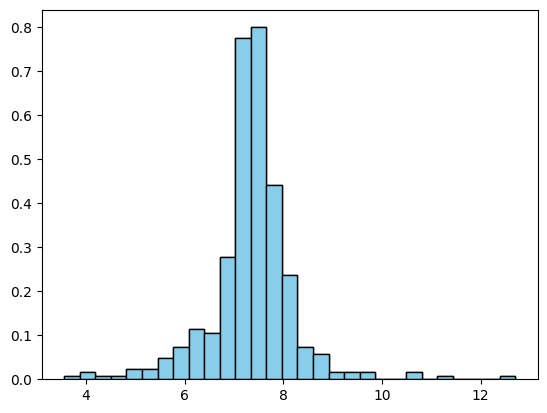

In [ ]:
ajuste(0)

mu     390.0300771208226
std    517.8156634363179


Coeficiente de determinación (R cuadrado) de la distribución gaussiana ajustada a los residuos: 0.070988297256813


Coeficiente de determinación (R cuadrado) de la distribución exponencial ajustada a los residuos: 0.38134522459938125


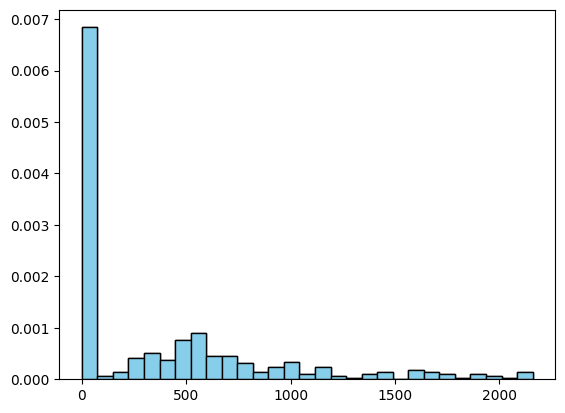

In [ ]:
ajuste(1)

mu     30.515732647814907
std    1.534776736311277


Coeficiente de determinación (R cuadrado) de la distribución gaussiana ajustada a los residuos: 0.9616276912330481


Coeficiente de determinación (R cuadrado) de la distribución exponencial ajustada a los residuos: -0.01963125282595901


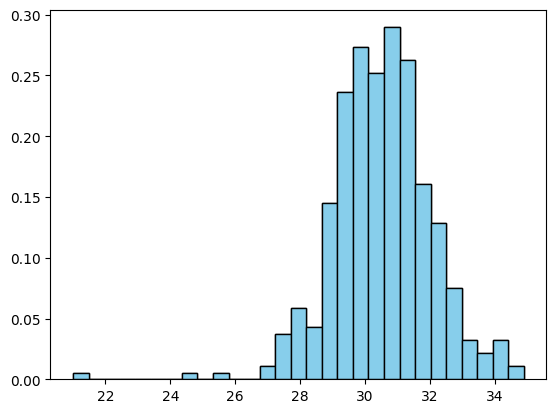

In [ ]:
ajuste(2)

mu     196.68396915167094
std    245.7301271854239


Coeficiente de determinación (R cuadrado) de la distribución gaussiana ajustada a los residuos: 0.06384666009923556


Coeficiente de determinación (R cuadrado) de la distribución exponencial ajustada a los residuos: 0.36333774486996295


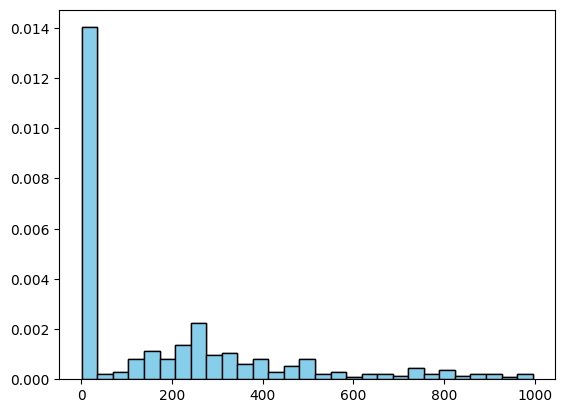

In [ ]:
ajuste(3)

mu     5.446838046272493
std    17.924519677896043


Coeficiente de determinación (R cuadrado) de la distribución gaussiana ajustada a los residuos: 0.25939365428680683


Coeficiente de determinación (R cuadrado) de la distribución exponencial ajustada a los residuos: 0.4232845433061756


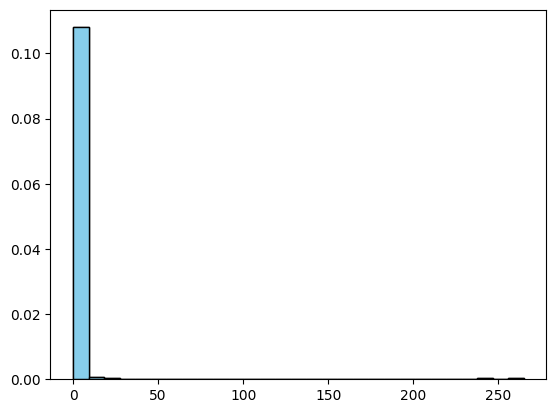

In [ ]:
ajuste(4)

mu     2.3374807197943444
std    3.308772996626021


Coeficiente de determinación (R cuadrado) de la distribución gaussiana ajustada a los residuos: 0.3681588411093619


Coeficiente de determinación (R cuadrado) de la distribución exponencial ajustada a los residuos: 0.8576024806173309


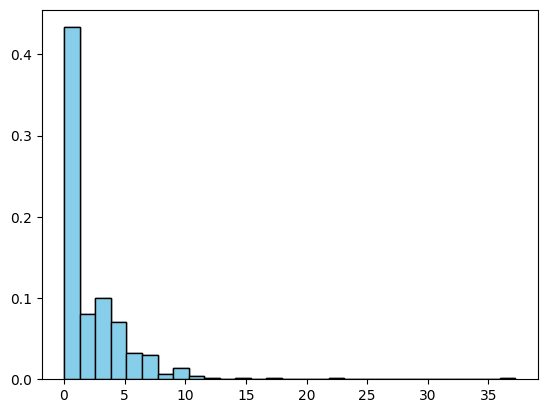

In [ ]:
ajuste(5)

mu     184.41692802056554
std    240.1228793740922


Coeficiente de determinación (R cuadrado) de la distribución gaussiana ajustada a los residuos: 0.1247138033243399


Coeficiente de determinación (R cuadrado) de la distribución exponencial ajustada a los residuos: 0.5785951826295814


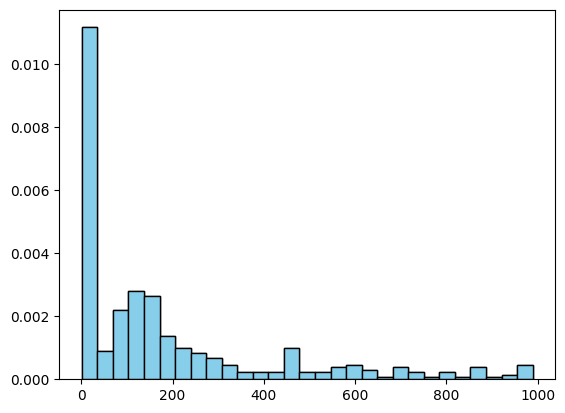

In [ ]:
ajuste(6)

In [ ]:
var=0
valuesaugmented=[]
valuesorigin=[]
valuesacotados=[]
valueszonas=[]
for zona in range(len(flujoDeNormalidad.zonasDeEstudio)):
  valuesaugmented.append(len(list(flujoDeNormalidad.augmented_data[flujoDeNormalidad.variables[var]][flujoDeNormalidad.zonasDeEstudio[zona]])))
  valuesorigin.append(len(list(flujoDeNormalidad.baseDeDatos[flujoDeNormalidad.baseDeDatos["MUNICIPIO"]==flujoDeNormalidad.zonasDeEstudio[zona]][flujoDeNormalidad.variables[var]])))
  valuesacotados.append(len(list(flujoDeNormalidad.resultados[variables[var]][flujoDeNormalidad.resultados[variables[var]]["MUNICIPIO"]==flujoDeNormalidad.zonasDeEstudio[zona]][variables[var]])))
  valueszonas.append(flujoDeNormalidad.zonasDeEstudio[zona])







# Datos para el diagrama de torta
labels = ['Manzanas', 'Plátanos', 'Naranjas', 'Uvas']
values = [20, 30, 25, 25]

# Crear el diagrama de torta
fig = go.Figure(data=[go.Pie(labels=valueszonas, values=valuesaugmented)])

# Agregar título al diagrama de torta
fig.update_layout(title='Numero de datos para datos aumentados')

# Mostrar siempre las etiquetas
fig.update_traces(textinfo='label+percent')

# Mostrar el diagrama de torta
fig.show()







# Crear el diagrama de torta
fig = go.Figure(data=[go.Pie(labels=valueszonas, values=valuesorigin)])

# Agregar título al diagrama de torta
fig.update_layout(title='Numero de datos para datos originales')

# Mostrar siempre las etiquetas
fig.update_traces(textinfo='label+percent')

# Mostrar el diagrama de torta
fig.show()







# Crear el diagrama de torta
fig = go.Figure(data=[go.Pie(labels=valueszonas, values=valuesacotados)])

# Agregar título al diagrama de torta
fig.update_layout(title='Numero de datos para datos sin valores atipicos')

# Mostrar siempre las etiquetas
fig.update_traces(textinfo='label+percent')

# Mostrar el diagrama de torta
fig.show()

In [ ]:

#for var in range(len(variables)):
var=5
# Crear un DataFrame vacío para almacenar los estadísticos
stats_df = pd.DataFrame(columns=['Variable', 'Zona', 'Tipo de datos', 'Media', 'Mediana', 'Desviación estándar'])
for zona in range(len(zonasDeEstudio)):
  # Calcular estadísticos para cada conjunto de datos
  augmented_data_stats = pd.DataFrame(flujoDeNormalidad.augmented_data[flujoDeNormalidad.variables[var]][flujoDeNormalidad.zonasDeEstudio[zona]]).describe()
  base_de_datos_stats = pd.DataFrame(flujoDeNormalidad.baseDeDatos[flujoDeNormalidad.baseDeDatos["MUNICIPIO"]==flujoDeNormalidad.zonasDeEstudio[zona]][flujoDeNormalidad.variables[var]]).describe()
  resultados_stats = pd.DataFrame(flujoDeNormalidad.resultados[variables[var]][flujoDeNormalidad.resultados[variables[var]]["MUNICIPIO"]==flujoDeNormalidad.zonasDeEstudio[zona]][variables[var]]).describe()
  n_augmented_data=len(flujoDeNormalidad.augmented_data[flujoDeNormalidad.variables[var]][flujoDeNormalidad.zonasDeEstudio[zona]])
  n_base_de_datos=len(flujoDeNormalidad.baseDeDatos[flujoDeNormalidad.baseDeDatos["MUNICIPIO"]==flujoDeNormalidad.zonasDeEstudio[zona]][flujoDeNormalidad.variables[var]])
  n_resultados=len(flujoDeNormalidad.resultados[variables[var]][flujoDeNormalidad.resultados[variables[var]]["MUNICIPIO"]==flujoDeNormalidad.zonasDeEstudio[zona]][variables[var]])
  # Añadir los estadísticos a la tabla
  stats_df = pd.concat([stats_df, pd.DataFrame([{
            'Variable': flujoDeNormalidad.variables[var],
            'Zona': flujoDeNormalidad.zonasDeEstudio[zona],
            'Tipo de datos': 'Datos aumentados',
            'Numero de datos':n_augmented_data,
            'Media': augmented_data_stats.loc['mean'][0],
            'Mediana': augmented_data_stats.loc['50%'][0],
            'Desviación estándar': augmented_data_stats.loc['std'][0]
  }])], ignore_index=True)

  stats_df = pd.concat([stats_df, pd.DataFrame([{
            'Variable': flujoDeNormalidad.variables[var],
            'Zona': flujoDeNormalidad.zonasDeEstudio[zona],
            'Tipo de datos': 'Base de datos original',
            'Numero de datos':n_base_de_datos,
            'Media': base_de_datos_stats.loc['mean'][0],
            'Mediana': base_de_datos_stats.loc['50%'][0],
            'Desviación estándar': base_de_datos_stats.loc['std'][0]
  }])], ignore_index=True)

  stats_df = pd.concat([stats_df, pd.DataFrame([{
            'Variable': flujoDeNormalidad.variables[var],
            'Zona': flujoDeNormalidad.zonasDeEstudio[zona],
            'Tipo de datos': 'Resultados',
            'Numero de datos':n_resultados,
            'Media': resultados_stats.loc['mean'][0],
            'Mediana': resultados_stats.loc['50%'][0],
            'Desviación estándar': resultados_stats.loc['std'][0]
  }])], ignore_index=True)

# Mostrar la tabla de estadísticos
stats_df

,Variable,Zona,Tipo de datos,Media,Mediana,Desviación estándar,Numero de datos
0,SALINIDAD,AGUSTÍN CODAZZI,Datos aumentados,1.767198,0.390000,2.675043,96.0
1,SALINIDAD,AGUSTÍN CODAZZI,Base de datos original,0.840000,0.270000,1.452680,59.0
2,SALINIDAD,AGUSTÍN CODAZZI,Resultados,0.272292,0.260000,0.116970,48.0
3,SALINIDAD,BECERRIL,Datos aumentados,1.075873,0.505000,1.231514,76.0
4,SALINIDAD,BECERRIL,Base de datos original,1.336000,0.460000,1.697218,40.0
5,SALINIDAD,BECERRIL,Resultados,1.079737,0.420000,1.298888,38.0
6,SALINIDAD,BOSCONIA,Datos aumentados,3.409476,0.607481,5.365863,12.0
7,SALINIDAD,BOSCONIA,Base de datos original,6.628333,4.320000,6.200417,6.0
8,SALINIDAD,BOSCONIA,Resultados,6.628333,4.320000,6.200417,6.0
9,SALINIDAD,CHIRIGUANÁ,Datos aumentados,1.154111,0.900000,1.093259,62.0


In [ ]:

for var in range(len(variables)):
  for zona in range(len(zonasDeEstudio)):
    fig = go.Figure()
    fig.add_trace(go.Histogram(x=flujoDeNormalidad.augmented_data[flujoDeNormalidad.variables[var]][flujoDeNormalidad.zonasDeEstudio[zona]], histnorm='probability',name='Base de datos aumentados',texttemplate="%{y:.3f}"))
    fig.add_trace(go.Histogram(x=flujoDeNormalidad.baseDeDatos[flujoDeNormalidad.baseDeDatos["MUNICIPIO"]==flujoDeNormalidad.zonasDeEstudio[zona]][flujoDeNormalidad.variables[var]], histnorm='probability',name='Base de datos original',texttemplate="%{y:.3f}"))
    fig.add_trace(go.Histogram(x=flujoDeNormalidad.resultados[variables[var]][flujoDeNormalidad.resultados[variables[var]]["MUNICIPIO"]==flujoDeNormalidad.zonasDeEstudio[zona]][variables[var]], histnorm='probability',name='resultados',texttemplate="%{y:.3f}"))


    fig.update_layout(title_text='Comparacion de base de datos de la zona de estudio ' + flujoDeNormalidad.zonasDeEstudio[zona],
                xaxis_title_text=flujoDeNormalidad.variables[var],
                yaxis_title_text='Densidad de probabilidad')

    fig.show()

In [ ]:


import numpy as np
from scipy import stats

# Supongamos que 'datos' es tu serie de datos
datos = np.array([-1, 2, 3, 4, 5])

# Añadir una constante positiva para asegurarse de que todos los datos sean positivos
datos_positivos = datos + 1
# Sumar una constante positiva para asegurarse de que todos los datos sean positivos
datos_positivos = datos_positivos + 1e-6  # Agregamos una pequeña cantidad para evitar ceros exactos

# Aplicar la transformación Box-Cox a los datos positivos
datos_transformados, lambda_value = stats.boxcox(datos_positivos)

# Imprimir los datos transformados y el valor de lambda
print("Datos transformados:", datos_transformados)
print("Valor de lambda:", lambda_value)


Datos transformados: [-3.27249342  1.30189102  1.72005812  2.07027093  2.37438854]
Valor de lambda: 0.3007866653786813


In [ ]:
from google.colab import files

### Obtener el Dataframe de los Datos corregidos, por Ejemplo, pH

In [ ]:

datosDepH = flujoDeNormalidad.resultados["pH"]

datosDeCond_Electrica = flujoDeNormalidad.resultados["CON.ELECTRICA"]

datosDeTemp = flujoDeNormalidad.resultados["TEMP"]

datosDeSDT = flujoDeNormalidad.resultados["SDT"]

datosDeO_DISUELTO = flujoDeNormalidad.resultados["O.DISUELTO"]

datosDeSALINIDAD = flujoDeNormalidad.resultados["SALINIDAD"]

datosDeRESISTIVIDAD = flujoDeNormalidad.resultados["RESISTIVIDAD"]

listadepurada=[datosDepH,datosDeCond_Electrica,datosDeTemp,datosDeSDT,datosDeO_DISUELTO,datosDeSALINIDAD,datosDeRESISTIVIDAD]
listadepurada
# ESTA LISTA COINCIDE CON LA LISTA DE VIARIABLES
variables

['pH',
 'CON.ELECTRICA',
 'TEMP',
 'SDT',
 'O.DISUELTO',
 'SALINIDAD',
 'RESISTIVIDAD']

In [ ]:
flujoDeNormalidad.resultados

{'pH':            MUNICIPIO        X        Y    pH
 0    AGUSTÍN CODAZZI  1090344  1600871  7.10
 1    AGUSTÍN CODAZZI  1089491  1600140  7.28
 2    AGUSTÍN CODAZZI  1077635  1594510  7.86
 3    AGUSTÍN CODAZZI  1090630  1600840  7.19
 4    AGUSTÍN CODAZZI  1089268  1599515  7.31
 ..               ...      ...      ...   ...
 384       VALLEDUPAR  1056921  1602525  7.07
 385       VALLEDUPAR  1046403  1589642  7.63
 386       VALLEDUPAR  1047521  1584574  7.75
 387       VALLEDUPAR  1044193  1592726  7.61
 388       VALLEDUPAR  1044288  1592758  7.71
 
 [372 rows x 4 columns],
 'CON.ELECTRICA':            MUNICIPIO        X        Y  CON.ELECTRICA
 0    AGUSTÍN CODAZZI  1090344  1600871         534.00
 1    AGUSTÍN CODAZZI  1089491  1600140         522.00
 2    AGUSTÍN CODAZZI  1077635  1594510         679.00
 3    AGUSTÍN CODAZZI  1090630  1600840         381.00
 4    AGUSTÍN CODAZZI  1089268  1599515         498.00
 ..               ...      ...      ...            ...
 379       VA

In [ ]:
variables


['pH',
 'CON.ELECTRICA',
 'TEMP',
 'SDT',
 'O.DISUELTO',
 'SALINIDAD',
 'RESISTIVIDAD']

In [ ]:
pHPorMunicipio=[]
for i in zonasDeEstudio:
  pHPorMunicipio.append(list(datosDepH[datosDepH['MUNICIPIO']==i][variables[0]]))

pHPorMunicipio = pd.DataFrame(
    {"pH": [item for sublist in pHPorMunicipio for item in sublist]},
    index=pd.MultiIndex.from_tuples([(nombre, j) for nombre, sublist in zip(zonasDeEstudio, pHPorMunicipio) for j, _ in enumerate(sublist)])
)
pHPorMunicipio


pH
AGUSTÍN CODAZZI 0   7.10
                1   7.28
                2   7.86
                3   7.19
                4   7.31
...                  ...
VALLEDUPAR      91  7.07
                92  7.63
                93  7.75
                94  7.61
                95  7.71

[372 rows x 1 columns]

In [ ]:
fig = go.Figure()
listass=[]#se crea data de numero de datos
for i in zonasDeEstudio:
  fig.add_trace(go.Histogram(x=pHPorMunicipio.loc[i]['pH'], histnorm='probability',name=i))
  listass.append(len(pHPorMunicipio.loc[i]['pH']))#se agregan


fig.update_layout(title_text='Gráfico de densidad de datos',
                  xaxis_title_text='pH',
                  yaxis_title_text='Densidad de probabilidad')

fig.show()





# Crear el diagrama de torta
fig = go.Figure(data=[go.Pie(labels=zonasDeEstudio, values=listass)])

# Agregar título al diagrama de torta
fig.update_layout(title='Numero de datos por municipios PH')

# Mostrar siempre las etiquetas
fig.update_traces(textinfo='label+percent')

# Mostrar el diagrama de torta
fig.show()

In [ ]:
#agustin codazzi
#becerriil
#jagua de ibirico,
#chiriguana
#el paso

In [ ]:
CON_ELECTRICAPorMunicipio=[]
for i in zonasDeEstudio:
  CON_ELECTRICAPorMunicipio.append(list(datosDeCond_Electrica[datosDeCond_Electrica['MUNICIPIO']==i][variables[1]]))

CON_ELECTRICAPorMunicipio = pd.DataFrame(
    {"CON_ELECTRICA": [item for sublist in CON_ELECTRICAPorMunicipio for item in sublist]},
    index=pd.MultiIndex.from_tuples([(nombre, j) for nombre, sublist in zip(zonasDeEstudio, CON_ELECTRICAPorMunicipio) for j, _ in enumerate(sublist)])
)

CON_ELECTRICAPorMunicipio

CON_ELECTRICA
AGUSTÍN CODAZZI 0          534.00
                1          522.00
                2          679.00
                3          381.00
                4          498.00
...                           ...
VALLEDUPAR      84           4.34
                85           3.76
                86           6.08
                87           7.95
                88          10.82

[364 rows x 1 columns]

In [ ]:
fig = go.Figure()
listass=[]#se crea data de numero de datos
for i in zonasDeEstudio:
  fig.add_trace(go.Histogram(x=CON_ELECTRICAPorMunicipio.loc[i]['CON_ELECTRICA'], histnorm='probability',name=i))
  listass.append(len(CON_ELECTRICAPorMunicipio.loc[i]['CON_ELECTRICA']))#se agregan

fig.update_layout(title_text='Gráfico de densidad de datos',
                  xaxis_title_text='CON_ELECTRICA',
                  yaxis_title_text='Densidad de probabilidad')

fig.show()


# Crear el diagrama de torta
fig = go.Figure(data=[go.Pie(labels=zonasDeEstudio, values=listass)])

# Agregar título al diagrama de torta
fig.update_layout(title='Numero de datos por municipios CON_ELECTRICA')

# Mostrar siempre las etiquetas
fig.update_traces(textinfo='label+percent')

# Mostrar el diagrama de torta
fig.show()




In [ ]:
TEMPPorMunicipio=[]
for i in zonasDeEstudio:
  TEMPPorMunicipio.append(list(datosDeTemp[datosDeTemp['MUNICIPIO']==i][variables[2]]))

TEMPPorMunicipio = pd.DataFrame(
    {"TEMP": [item for sublist in TEMPPorMunicipio for item in sublist]},
    index=pd.MultiIndex.from_tuples([(nombre, j) for nombre, sublist in zip(zonasDeEstudio, TEMPPorMunicipio) for j, _ in enumerate(sublist)])
)


TEMPPorMunicipio

TEMP
AGUSTÍN CODAZZI 0   30.3
                1   30.5
                2   30.4
                3   30.1
                4   30.4
...                  ...
VALLEDUPAR      92  31.4
                93  30.2
                94  30.4
                95  30.6
                96  28.5

[386 rows x 1 columns]

In [ ]:
fig = go.Figure()
listass=[]#se crea data de numero de datos
for i in zonasDeEstudio:
  fig.add_trace(go.Histogram(x=TEMPPorMunicipio.loc[i]['TEMP'], histnorm='probability',name=i))
  listass.append(len(TEMPPorMunicipio.loc[i]['TEMP']))#se agregan

fig.update_layout(title_text='Gráfico de densidad de datos',
                  xaxis_title_text='TEMP',
                  yaxis_title_text='Densidad de probabilidad')

fig.show()

# Crear el diagrama de torta
fig = go.Figure(data=[go.Pie(labels=zonasDeEstudio, values=listass)])

# Agregar título al diagrama de torta
fig.update_layout(title='Numero de datos por municipios TEMP')

# Mostrar siempre las etiquetas
fig.update_traces(textinfo='label+percent')

# Mostrar el diagrama de torta
fig.show()








In [ ]:
SDTPorMunicipio=[]
for i in zonasDeEstudio:
  SDTPorMunicipio.append(list(datosDeSDT[datosDeSDT['MUNICIPIO']==i][variables[3]]))

SDTPorMunicipio = pd.DataFrame(
    {"SDT": [item for sublist in SDTPorMunicipio for item in sublist]},
    index=pd.MultiIndex.from_tuples([(nombre, j) for nombre, sublist in zip(zonasDeEstudio, SDTPorMunicipio) for j, _ in enumerate(sublist)])
)


SDTPorMunicipio

SDT
AGUSTÍN CODAZZI 0   259.000
                1   253.000
                2   330.000
                3   183.200
                4   240.000
...                     ...
VALLEDUPAR      85    1.260
                86    1.946
                87    3.220
                88    4.270
                89    5.919

[365 rows x 1 columns]

In [ ]:
fig = go.Figure()
listass=[]#se crea data de numero de datos
for i in zonasDeEstudio:
  fig.add_trace(go.Histogram(x=SDTPorMunicipio.loc[i]['SDT'], histnorm='probability',name=i))
  listass.append(len(SDTPorMunicipio.loc[i]['SDT']))#se agregan

fig.update_layout(title_text='Gráfico de densidad de datos',
                  xaxis_title_text='SDT',
                  yaxis_title_text='Densidad de probabilidad')

fig.show()

# Crear el diagrama de torta
fig = go.Figure(data=[go.Pie(labels=zonasDeEstudio, values=listass)])

# Agregar título al diagrama de torta
fig.update_layout(title='Numero de datos por municipios SDT')

# Mostrar siempre las etiquetas
fig.update_traces(textinfo='label+percent')

# Mostrar el diagrama de torta
fig.show()





In [ ]:
O_DISULETO_PorMunicipio=[]
for i in zonasDeEstudio:
  O_DISULETO_PorMunicipio.append(list(datosDeO_DISUELTO[datosDeO_DISUELTO['MUNICIPIO']==i][variables[4]]))

O_DISULETO_PorMunicipio = pd.DataFrame(
    {"O_DISULETO": [item for sublist in O_DISULETO_PorMunicipio for item in sublist]},
    index=pd.MultiIndex.from_tuples([(nombre, j) for nombre, sublist in zip(zonasDeEstudio, O_DISULETO_PorMunicipio) for j, _ in enumerate(sublist)])
)


O_DISULETO_PorMunicipio

O_DISULETO
AGUSTÍN CODAZZI 0         5.16
                1         5.66
                2         6.39
                3         5.08
                4         5.94
...                        ...
VALLEDUPAR      92        0.15
                93        2.10
                94        2.44
                95        6.31
                96        4.70

[384 rows x 1 columns]

In [ ]:
fig = go.Figure()
listass=[]#se crea data de numero de datos
for i in zonasDeEstudio:
  fig.add_trace(go.Histogram(x=O_DISULETO_PorMunicipio.loc[i]['O_DISULETO'], histnorm='probability',name=i))
  listass.append(len(O_DISULETO_PorMunicipio.loc[i]['O_DISULETO']))#se agregan

fig.update_layout(title_text='Gráfico de densidad de datos',
                  xaxis_title_text='O_DISULETO',
                  yaxis_title_text='Densidad de probabilidad')

fig.show()


# Crear el diagrama de torta
fig = go.Figure(data=[go.Pie(labels=zonasDeEstudio, values=listass)])

# Agregar título al diagrama de torta
fig.update_layout(title='Numero de datos por municipios O_DISULETO')

# Mostrar siempre las etiquetas
fig.update_traces(textinfo='label+percent')

# Mostrar el diagrama de torta
fig.show()







In [ ]:
SALINIDAD_PorMunicipio=[]
for i in zonasDeEstudio:
  SALINIDAD_PorMunicipio.append(list(datosDeSALINIDAD[datosDeSALINIDAD['MUNICIPIO']==i][variables[5]]))

SALINIDAD_PorMunicipio = pd.DataFrame(
    {"SALINIDAD": [item for sublist in SALINIDAD_PorMunicipio for item in sublist]},
    index=pd.MultiIndex.from_tuples([(nombre, j) for nombre, sublist in zip(zonasDeEstudio, SALINIDAD_PorMunicipio) for j, _ in enumerate(sublist)])
)


SALINIDAD_PorMunicipio

SALINIDAD
AGUSTÍN CODAZZI 0        0.26
                1        0.25
                2        0.33
                3        0.18
                4        0.24
...                       ...
VALLEDUPAR      91       6.07
                92       0.24
                93       0.34
                94       0.23
                95       0.22

[359 rows x 1 columns]

In [ ]:
fig = go.Figure()
listass=[]#se crea data de numero de datos
for i in zonasDeEstudio:
  fig.add_trace(go.Histogram(x=SALINIDAD_PorMunicipio.loc[i]['SALINIDAD'], histnorm='probability',name=i))
  listass.append(len(SALINIDAD_PorMunicipio.loc[i]['SALINIDAD']))#se agregan

fig.update_layout(title_text='Gráfico de densidad de datos',
                  xaxis_title_text='SALINIDAD',
                  yaxis_title_text='Densidad de probabilidad')

fig.show()


# Crear el diagrama de torta
fig = go.Figure(data=[go.Pie(labels=zonasDeEstudio, values=listass)])

# Agregar título al diagrama de torta
fig.update_layout(title='Numero de datos por municipios SALINIDAD')

# Mostrar siempre las etiquetas
fig.update_traces(textinfo='label+percent')

# Mostrar el diagrama de torta
fig.show()





In [ ]:
RESISTIVIDAD_PorMunicipio=[]
for i in zonasDeEstudio:
  RESISTIVIDAD_PorMunicipio.append(list(datosDeRESISTIVIDAD[datosDeRESISTIVIDAD['MUNICIPIO']==i][variables[6]]))

RESISTIVIDAD_PorMunicipio = pd.DataFrame(
    {"RESISTIVIDAD": [item for sublist in RESISTIVIDAD_PorMunicipio for item in sublist]},
    index=pd.MultiIndex.from_tuples([(nombre, j) for nombre, sublist in zip(zonasDeEstudio, RESISTIVIDAD_PorMunicipio) for j, _ in enumerate(sublist)])
)


RESISTIVIDAD_PorMunicipio

RESISTIVIDAD
AGUSTÍN CODAZZI 0          1.871
                1          1.313
                2          1.435
                3          2.630
                4          2.015
...                          ...
VALLEDUPAR      87        93.200
                88         1.995
                89         1.425
                90         2.091
                91         2.119

[348 rows x 1 columns]

In [ ]:
fig = go.Figure()
listass=[]#se crea data de numero de datos
for i in zonasDeEstudio:
  fig.add_trace(go.Histogram(x=RESISTIVIDAD_PorMunicipio.loc[i]['RESISTIVIDAD'], histnorm='probability',name=i))
  listass.append(len(RESISTIVIDAD_PorMunicipio.loc[i]['RESISTIVIDAD']))#se agregan

fig.update_layout(title_text='Gráfico de densidad de datos',
                  xaxis_title_text='RESISTIVIDAD',
                  yaxis_title_text='Densidad de probabilidad')

fig.show()


# Crear el diagrama de torta
fig = go.Figure(data=[go.Pie(labels=zonasDeEstudio, values=listass)])

# Agregar título al diagrama de torta
fig.update_layout(title='Numero de datos por municipios RESISTIVIDAD')

# Mostrar siempre las etiquetas
fig.update_traces(textinfo='label+percent')

# Mostrar el diagrama de torta
fig.show()




# Kriging (pyKrige)

### Definir la Tendencia Espacial



*   Morán, P. A. P. (1950). Notes on continuous stochastic phenomena. Biometrika, 37(1-2), 17-23. https://doi.org/10.1093/biomet/37.1-2.17
*   Chen, J., Wang, S., Han, Y., Zhang, Y., Li, Y., Zhang, B., Li, X., & Zhang, J. (2024). Geodetector analysis of individual and joint impacts of natural and human factors on maternal and child health at the provincial scale. Scientific Reports, 14(1). https://doi.org/10.1038/s41598-024-52282-2
*   Luo, H., Wang, C., Li, C., Meng, X., Yang, X., & Tan, Q. (2024). Multi-scale carbon emission characterization and prediction based on land use and interpretable machine learning model: A case study of the Yangtze River Delta Region, China. Applied Energy, 360, 122819. https://doi.org/10.1016/j.apenergy.2024.122819
*   Schmal, C., Myung, J., Herzel, H., & Bordyugov, G. (2017). Moran’s I quantifies spatio-temporal pattern formation in neural imaging data. Bioinformatics, 33(19), 3072-3079. https://doi.org/10.1093/bioinformatics/btx351
*   Miller, B. F., DeYoung, R. W., Campbell, T. A., Laseter, B. R., Ford, W. M., & Miller, K. V. (2010). Fine-scale genetic and social structuring in a central Appalachian white-tailed deer herd. Journal Of Mammalogy, 91(3), 681-689. https://doi.org/10.1644/09-mamm-a-258.1

In [ ]:
#definir_tendencia_espacial(datosDepH)

# Core - Stand By

In [ ]:
# Eliminar filas donde el valor en la columna "columna_PH" es igual a 0
data

array([1, 1, 3, 4, 2, 4, 1, 3, 5, 2, 3, 3, 4, 4, 2, 3, 2, 2, 2, 5, 3, 2,
       2, 2, 4, 1, 3, 3, 2, 2, 1, 1, 2, 2, 2, 1, 2, 3, 3, 3, 1, 2, 1, 4,
       3, 3, 3, 1, 2, 3, 3, 4, 4, 2, 1, 3, 4, 3, 4, 4, 3, 3, 1, 2, 3, 2,
       1, 3, 2, 4, 3, 3, 2, 4, 3, 3, 3, 1, 3, 4, 1, 2, 2, 4, 2, 1, 3, 3,
       3, 4, 2, 2, 1, 2, 4, 5, 1, 5, 2, 2, 3, 2, 3, 3, 3, 2, 3, 1, 4, 2,
       4, 2, 1, 2, 1, 4, 3, 2, 3, 2, 3, 4, 2, 2, 2, 2, 3, 3, 2, 1, 3, 4,
       3, 2, 3, 2, 3, 3, 2, 0, 4, 2, 1, 1, 3, 2, 3, 3, 3, 2, 3, 3, 3, 4,
       3, 2, 4, 2, 3, 3, 1, 2, 1, 4, 1, 4, 3, 3, 3, 2, 4, 2, 3, 5, 1, 2,
       1, 3, 3, 3, 5, 2, 3, 3, 4, 2, 2, 4, 3, 3, 3, 2, 0, 3, 3, 3, 2, 4,
       3, 2, 5, 2, 4, 2, 1, 3, 1, 2, 2, 3, 3, 3, 3, 3, 3, 3, 1, 1, 2, 3,
       2, 3, 2, 3, 4, 2, 3, 2, 2, 4, 1, 2, 3, 2, 2, 3, 1, 4, 4, 2, 2, 4,
       3, 3, 1, 2, 4, 1, 3, 4, 5, 4, 3, 2, 1, 3, 3, 2, 3, 3, 1, 4, 2, 4,
       1, 1, 3, 3, 0, 3, 4, 2, 3, 1, 3, 3, 3, 2, 3, 3, 3, 3, 3, 5, 3, 3,
       2, 2, 1, 1, 3, 3, 2, 3, 2, 4, 4, 3, 1, 3, 3,

# PH

# CONDUC_ELE

In [ ]:
#listaCoordenadasEste=[]
#for i in range(len(listaMunicipios)):
#    coordenadasDeMunicipio=[]
#    for j in range(len(data[data['MUNICIPIO']==listaMunicipios[i]])):
#        if float(data[data['MUNICIPIO']==listaMunicipios[i]]['PH'].iloc[j])<6:
#            coordenadasDeMunicipio.append(float(str(data[data['MUNICIPIO']==listaMunicipios[i]]['COOR_ESTE'].iloc[j]).replace('.', '')))
#    listaCoordenadasEste.append(coordenadasDeMunicipio)
#    #'COOR_ESTE', 'COOR_NORTE'
#print(listaCoordenadasEste)

In [ ]:
#listaCoordenadasNorte=[]
#for i in range(len(listaMunicipios)):
#    coordenadasDeMunicipio=[]
#    for j in range(len(data[data['MUNICIPIO']==listaMunicipios[i]])):
#        if float(data[data['MUNICIPIO']==listaMunicipios[i]]['PH'].iloc[j])<6:
#            coordenadasDeMunicipio.append(float(str(data[data['MUNICIPIO']==listaMunicipios[i]]['COOR_NORTE'].iloc[j]).replace('.', '')))
#    listaCoordenadasNorte.append(coordenadasDeMunicipio)
#    #'COOR_ESTE', 'COOR_NORTE'
#print(listaCoordenadasNorte)

In [ ]:
#df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/earthquakes-23k.csv')

#import plotly.express as px
#fig = px.density_mapbox(df, lat='Latitude', lon='Longitude', z='Magnitude', radius=10,
#                        center=dict(lat=0, lon=180), zoom=0,
#                        mapbox_style="open-street-map")
#fig.show()

# Calculadora de semivarianza

# Ajuste del modelo

# Matriz de covarianza

In [ ]:
#np.linalg.inv(cov_matrix)

# Documentación de Krging

![image.png](attachment:image.png)

![image.png](attachment:image.png)

![image.png](attachment:image.png)


![image.png](attachment:image.png)


![image.png](attachment:image.png)


# Prueba de hipotesis

In [ ]:
import numpy as np
from scipy import stats

In [ ]:
def prueba_de_hipotesis(datos1,datos2):
    # Generar datos de ejemplo
    #datos1 = np.random.normal(loc=10, scale=3, size=100)  # Datos de la muestra 1
    #datos2 = np.random.normal(loc=12, scale=3, size=100)  # Datos de la muestra 2
    #datos1=listaPH[1]
    #datos2=listaPH[0]


    # Realizar la prueba de hipótesis (prueba t de Student independiente)
    t_stat, p_valor = stats.ttest_ind(datos1, datos2)

    # Imprimir el resultado de la prueba
    print("Estadístico t:", t_stat)
    print("Valor p:", p_valor)

    # Interpretar el resultado
    nivel_significancia = 0.05
    if p_valor < nivel_significancia:
        print("Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.")
    else:
        print("No se rechaza la hipótesis nula; no hay suficiente evidencia para concluir que las medias son diferentes.")


In [ ]:
def prueba_de_hipotesis_desviaciones(datos1,datos2):
    # Generar datos de ejemplo
    #np.random.seed(42)
    #datos1 = np.random.normal(loc=0, scale=1, size=100)  # Muestra 1
    #datos2 = np.random.normal(loc=0, scale=1.5, size=100)  # Muestra 2

    # Realizar el test de Levene
    stat_levene, p_valor_levene = stats.levene(datos1, datos2)
    print("Test de Levene:")
    print("Estadístico de prueba:", stat_levene)
    print("Valor p:", p_valor_levene)

    # Realizar el test de Bartlett
    stat_bartlett, p_valor_bartlett = stats.bartlett(datos1, datos2)
    print("\nTest de Bartlett:")
    print("Estadístico de prueba:", stat_bartlett)
    print("Valor p:", p_valor_bartlett)

    # Interpretar los resultados
    nivel_significancia = 0.05
    if p_valor_levene < nivel_significancia:
        print("\nRechazar la hipótesis nula según el test de Levene; las desviaciones estándar son diferentes.")
    else:
        print("\nNo se rechaza la hipótesis nula según el test de Levene; no hay suficiente evidencia para concluir que las desviaciones estándar son diferentes.")

    if p_valor_bartlett < nivel_significancia:
        print("Rechazar la hipótesis nula según el test de Bartlett; las desviaciones estándar son diferentes.")
    else:
        print("No se rechaza la hipótesis nula según el test de Bartlett; no hay suficiente evidencia para concluir que las desviaciones estándar son diferentes.")


In [ ]:
def hipotesisMedia(variable):
    print("******"+str(variable)+"*********")
    print("-->Comparacion de la media de los municipios: ",flujoDeNormalidad.zonasDeEstudio[8]," y ",flujoDeNormalidad.zonasDeEstudio[0],":")
    datos1=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[8]]
    datos2=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[0]]
    prueba_de_hipotesis(datos1,datos2)
    print("\n")
    print("-->Comparacion de la media de los municipios: ",flujoDeNormalidad.zonasDeEstudio[8]," y ",flujoDeNormalidad.zonasDeEstudio[1],":")
    datos1=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[8]]
    datos2=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[1]]
    prueba_de_hipotesis(datos1,datos2)
    print("\n")
    print("-->Comparacion de la media de los municipios: ",flujoDeNormalidad.zonasDeEstudio[8]," y ",flujoDeNormalidad.zonasDeEstudio[2],":")
    datos1=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[8]]
    datos2=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[2]]
    prueba_de_hipotesis(datos1,datos2)
    print("\n")
    print("-->Comparacion de la media de los municipios: ",flujoDeNormalidad.zonasDeEstudio[8]," y ",flujoDeNormalidad.zonasDeEstudio[3],":")
    datos1=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[8]]
    datos2=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[3]]
    prueba_de_hipotesis(datos1,datos2)
    print("\n")
    print("-->Comparacion de la media de los municipios: ",flujoDeNormalidad.zonasDeEstudio[8]," y ",flujoDeNormalidad.zonasDeEstudio[4],":")
    datos1=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[8]]
    datos2=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[4]]
    prueba_de_hipotesis(datos1,datos2)
    print("\n")
    print("-->Comparacion de la media de los municipios: ",flujoDeNormalidad.zonasDeEstudio[8]," y ",flujoDeNormalidad.zonasDeEstudio[5],":")
    datos1=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[8]]
    datos2=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[5]]
    prueba_de_hipotesis(datos1,datos2)
    print("\n")
    print("-->Comparacion de la media de los municipios: ",flujoDeNormalidad.zonasDeEstudio[8]," y ",flujoDeNormalidad.zonasDeEstudio[6],":")
    datos1=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[8]]
    datos2=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[6]]
    prueba_de_hipotesis(datos1,datos2)
    print("\n")
    print("-->Comparacion de la media de los municipios: ",flujoDeNormalidad.zonasDeEstudio[8]," y ",flujoDeNormalidad.zonasDeEstudio[7],":")
    datos1=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[8]]
    datos2=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[7]]
    prueba_de_hipotesis(datos1,datos2)
    print("\n")

In [ ]:
def hipotesisDst(variable):
    print("******"+str(variable)+"*********")
    print("-->Comparacion de la desviacion std de los municipios: ",flujoDeNormalidad.zonasDeEstudio[8]," y ",flujoDeNormalidad.zonasDeEstudio[0],":")
    datos1=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[8]]
    datos2=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[0]]
    prueba_de_hipotesis_desviaciones(datos1,datos2)
    print("\n")
    print("-->Comparacion de la desviacion std de los municipios: ",flujoDeNormalidad.zonasDeEstudio[8]," y ",flujoDeNormalidad.zonasDeEstudio[1],":")
    datos1=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[8]]
    datos2=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[1]]
    prueba_de_hipotesis_desviaciones(datos1,datos2)
    print("\n")
    print("-->Comparacion de la desviacion std de los municipios: ",flujoDeNormalidad.zonasDeEstudio[8]," y ",flujoDeNormalidad.zonasDeEstudio[2],":")
    datos1=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[8]]
    datos2=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[2]]
    prueba_de_hipotesis_desviaciones(datos1,datos2)
    print("\n")
    print("-->Comparacion de la desviacion std de los municipios: ",flujoDeNormalidad.zonasDeEstudio[8]," y ",flujoDeNormalidad.zonasDeEstudio[3],":")
    datos1=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[8]]
    datos2=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[3]]
    prueba_de_hipotesis_desviaciones(datos1,datos2)
    print("\n")
    print("-->Comparacion de la desviacion std de los municipios: ",flujoDeNormalidad.zonasDeEstudio[8]," y ",flujoDeNormalidad.zonasDeEstudio[4],":")
    datos1=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[8]]
    datos2=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[4]]
    prueba_de_hipotesis_desviaciones(datos1,datos2)
    print("\n")
    print("-->Comparacion de la desviacion std de los municipios: ",flujoDeNormalidad.zonasDeEstudio[8]," y ",flujoDeNormalidad.zonasDeEstudio[5],":")
    datos1=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[8]]
    datos2=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[5]]
    prueba_de_hipotesis_desviaciones(datos1,datos2)
    print("\n")
    print("-->Comparacion de la desviacion std de los municipios: ",flujoDeNormalidad.zonasDeEstudio[8]," y ",flujoDeNormalidad.zonasDeEstudio[6],":")
    datos1=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[8]]
    datos2=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[6]]
    prueba_de_hipotesis_desviaciones(datos1,datos2)
    print("\n")
    print("-->Comparacion de la desviacion std de los municipios: ",flujoDeNormalidad.zonasDeEstudio[8]," y ",lflujoDeNormalidad.zonasDeEstudio[7],":")
    datos1=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[8]]
    datos2=flujoDeNormalidad.augmented_data[variable][flujoDeNormalidad.zonasDeEstudio[7]]
    prueba_de_hipotesis_desviaciones(datos1,datos2)
    print("\n")

In [ ]:
hipotesisMedia(flujoDeNormalidad.variables[0])

******pH*********
-->Comparacion de la media de los municipios:  VALLEDUPAR  y  AGUSTÍN CODAZZI :
Estadístico t: 4.220148019413798
Valor p: 3.269118233083978e-05
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  BECERRIL :
Estadístico t: -0.5262458509316551
Valor p: 0.5991526209791069
No se rechaza la hipótesis nula; no hay suficiente evidencia para concluir que las medias son diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  BOSCONIA :
Estadístico t: 9.17980800701428
Valor p: 5.1953956882742665e-17
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  CHIRIGUANÁ :
Estadístico t: 4.933076938022227
Valor p: 1.439999392059012e-06
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  LA PAZ :
Estadístico t: 6.41

In [ ]:
hipotesisMedia(flujoDeNormalidad.variables[1])

******CON.ELECTRICA*********
-->Comparacion de la media de los municipios:  VALLEDUPAR  y  AGUSTÍN CODAZZI :
Estadístico t: -10.071314158894207
Valor p: 1.2844712849530617e-20
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  BECERRIL :
Estadístico t: -8.610923517690525
Valor p: 7.7530451337755675e-16
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  BOSCONIA :
Estadístico t: -1.2668677079289394
Valor p: 0.20678663017665566
No se rechaza la hipótesis nula; no hay suficiente evidencia para concluir que las medias son diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  CHIRIGUANÁ :
Estadístico t: -6.624151431311378
Valor p: 2.1258367458828544e-10
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  LA PAZ :


In [ ]:
hipotesisMedia(flujoDeNormalidad.variables[2])

******TEMP*********
-->Comparacion de la media de los municipios:  VALLEDUPAR  y  AGUSTÍN CODAZZI :
Estadístico t: 1.0508455983171723
Valor p: 0.29415329980635974
No se rechaza la hipótesis nula; no hay suficiente evidencia para concluir que las medias son diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  BECERRIL :
Estadístico t: -1.2683932267263787
Valor p: 0.2057420673005642
No se rechaza la hipótesis nula; no hay suficiente evidencia para concluir que las medias son diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  BOSCONIA :
Estadístico t: -0.9366268424907584
Valor p: 0.3500580242985206
No se rechaza la hipótesis nula; no hay suficiente evidencia para concluir que las medias son diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  CHIRIGUANÁ :
Estadístico t: -3.490770336193334
Valor p: 0.0005636589937113705
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la medi

In [ ]:
hipotesisMedia(flujoDeNormalidad.variables[3])

******SDT*********
-->Comparacion de la media de los municipios:  VALLEDUPAR  y  AGUSTÍN CODAZZI :
Estadístico t: -10.187637702017376
Valor p: 5.595923074879775e-21
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  BECERRIL :
Estadístico t: -8.180117286105615
Valor p: 1.2983007867957726e-14
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  BOSCONIA :
Estadístico t: -1.759506991992584
Valor p: 0.08011800351374644
No se rechaza la hipótesis nula; no hay suficiente evidencia para concluir que las medias son diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  CHIRIGUANÁ :
Estadístico t: -7.209496863937432
Valor p: 6.530688714736926e-12
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  LA PAZ :
Estadístico t

In [ ]:
hipotesisMedia(flujoDeNormalidad.variables[4])

******O.DISUELTO*********
-->Comparacion de la media de los municipios:  VALLEDUPAR  y  AGUSTÍN CODAZZI :
Estadístico t: 2.562368279017204
Valor p: 0.010871459001961644
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  BECERRIL :
Estadístico t: 3.3704375775505966
Valor p: 0.0008592519900156318
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  BOSCONIA :
Estadístico t: 2.657331284082946
Valor p: 0.008499905439307127
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  CHIRIGUANÁ :
Estadístico t: 5.22646840200745
Valor p: 3.513751632221977e-07
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  LA PAZ :
Estadístico t: -0.7874232482882746
Valor p: 

In [ ]:
hipotesisMedia(flujoDeNormalidad.variables[5])

******SALINIDAD*********
-->Comparacion de la media de los municipios:  VALLEDUPAR  y  AGUSTÍN CODAZZI :
Estadístico t: 1.5298755505812607
Valor p: 0.12715280874975124
No se rechaza la hipótesis nula; no hay suficiente evidencia para concluir que las medias son diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  BECERRIL :
Estadístico t: 3.780763009247487
Valor p: 0.0001930759161442669
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  BOSCONIA :
Estadístico t: -1.3275546321879776
Valor p: 0.18582362196842905
No se rechaza la hipótesis nula; no hay suficiente evidencia para concluir que las medias son diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  CHIRIGUANÁ :
Estadístico t: 3.2371809554393614
Valor p: 0.0013690510009213765
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VAL

In [ ]:
hipotesisMedia(flujoDeNormalidad.variables[6])

******RESISTIVIDAD*********
-->Comparacion de la media de los municipios:  VALLEDUPAR  y  AGUSTÍN CODAZZI :
Estadístico t: 7.394168474211601
Valor p: 1.7648363464610264e-12
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  BECERRIL :
Estadístico t: 3.211460874510193
Valor p: 0.0014952069108528643
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  BOSCONIA :
Estadístico t: 0.46683593089575504
Valor p: 0.641146566705747
No se rechaza la hipótesis nula; no hay suficiente evidencia para concluir que las medias son diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  CHIRIGUANÁ :
Estadístico t: -5.115441875076307
Valor p: 6.14313678641438e-07
Se rechaza la hipótesis nula; las medias son estadísticamente diferentes.


-->Comparacion de la media de los municipios:  VALLEDUPAR  y  LA PAZ :
Estadísti

# Regresion

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
import plotly.graph_objects as go
import time
from sklearn.cluster import KMeans


In [ ]:

def gaussRegresor(X_train, z_train, X_pred, n, x_min, x_max, y_min, y_max, z_min, z_max, length_scale, z,XX_train):

    kernel = 1 * RBF(length_scale)
    gp = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=50)
    print("kernel  ",kernel)
    print("n_restarts_optimizer   ",50)
    print("length_scale    ",length_scale)

    # Entrenar el modelo
    gp.fit(X_train, z_train)

    # Hacer predicciones en la malla de puntos de entrada
    z_pred, sigma = gp.predict(X_pred, return_std=True)
    _pred, sigma2 = gp.predict(XX_train, return_std=True)#este es para comoparar con los centroides

    # Crear la superficie de la predicción
    surface = go.Surface(x=X_pred[:, 0].reshape(n, n),  # Corregido: las coordenadas x deben ser la primera columna de X_pred
                         y=X_pred[:, 1].reshape(n, n),  # Corregido: las coordenadas y deben ser la segunda columna de X_pred
                         z=z_pred.reshape(n, n),
                         cmin=z_min,
                         cmax=z_max)

    # Crear el objeto de dispersión para los puntos de entrenamiento
    scatter = go.Scatter3d(x=X_train[:, 0], y=X_train[:, 1], z=z, mode='markers',
    #scatter = go.Scatter3d(x=X_train[:, 0], y=X_train[:, 1], z=z_train, mode='markers',
                           marker=dict(size=2, color='red'), name='Datos de entrenamiento')

    # Crear la figura y agregar la superficie y los puntos de entrenamiento
    fig = go.Figure(data=[surface, scatter])

    # Establecer el título y las etiquetas de los ejes
    fig.update_layout(title='Predicción con Regresión de Proceso Gaussiano',
                      scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z',
                                 xaxis_range=[x_min, x_max], yaxis_range=[y_min, y_max]))#,
                                 #zaxis_range=[z_min, z_max]))

    # Mostrar la figura
    fig.show()
    return (surface,_pred, sigma2,X_pred,z_pred)

nn = 200
# Generar datos de ejemplo
np.random.seed(0)
# Generar coordenadas x, y
X_train = np.random.uniform(0, 10, (nn, 2))
# Generar valores z
z_train = np.sin(X_train[:, 0]) * np.cos(X_train[:, 1])

# Generar una malla de puntos de entrada para hacer predicciones
x_pred = np.linspace(0, 10, nn)
y_pred = np.linspace(0, 10, nn)
X_pred = np.array(np.meshgrid(x_pred, y_pred)).T.reshape(-1, 2)

# Establecer límites de los ejes
x_min, x_max = 0, 10
y_min, y_max = 0, 10
z_min, z_max = -10, 10
length_scale = 1

#gaussRegresor(X_train, z_train, X_pred, nn, x_min, x_max, y_min, y_max, z_min, z_max, length_scale, z_train,X_train)


In [ ]:
def scater(X_train,z,puntos):

    # Crear el objeto de dispersión para los puntos de entrenamiento
  scatter = go.Scatter3d(x=X_train[:, 1], y=X_train[:, 0], z=z, mode='markers',
                       marker=dict(size=2, color='red'), name='Datos de entrenamiento')

    # Crear la figura y agregar la superficie y los puntos de entrenamiento
    #fig = go.Figure(data=[scatter])
  fig = go.Figure(data=scatter)

    # Establecer el título y las etiquetas de los ejes
  fig.update_layout(title=puntos,
                  scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'))#,\
                            #xaxis_range=[x_min, x_max], yaxis_range=[y_min, y_max],\
                            #zaxis_range=[z_min, z_max]))

    # Mostrar la figura
  fig.show()

In [ ]:
 # Establecer límites de los ejes
x_min, x_max = 1012687.0, 1108138.0  # Ejemplo, establece los valores mínimos y máximos deseados para el eje x
y_min, y_max = 1516841.0, 1657233.0  # Ejemplo, establece los valores mínimos y máximos deseados para el eje y
#n = 20
def graficosurfe(X_train,z,X_pred,surface,n,x_min, x_max,y_min, y_max,z_min, z_max,length_scale):


    # Crear el objeto de dispersión para los puntos de entrenamiento
    scatter = go.Scatter3d(x=X_train[:, 0], y=X_train[:, 1], z=z, mode='markers',
    #scatter = go.Scatter3d(x=X_train[:, 0], y=X_train[:, 1], z=z_train, mode='markers',
                           marker=dict(size=2, color='red'), name='Datos de entrenamiento')

    # Crear la figura y agregar la superficie y los puntos de entrenamiento
    fig = go.Figure(data=[surface, scatter])

    # Establecer el título y las etiquetas de los ejes
    fig.update_layout(title='Predicción con Regresión de Proceso Gaussiano',
                      scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z',
                                 xaxis_range=[x_min, x_max], yaxis_range=[y_min, y_max]))#,
                                 #zaxis_range=[z_min, z_max]))

    # Mostrar la figura
    fig.show()







def modelo(i):

  x_train = np.array(flujoDeNormalidad.resultados[flujoDeNormalidad.variables[i]]["X"])
  y_train = np.array(flujoDeNormalidad.resultados[flujoDeNormalidad.variables[i]]["Y"])
  X_train =np.column_stack((x_train, y_train))
  z=np.array(flujoDeNormalidad.resultados[flujoDeNormalidad.variables[i]][flujoDeNormalidad.variables[i]])
  #grafica de puntos
  scater(X_train,z,str(flujoDeNormalidad.variables[i]))

  #configuracion de Kmeans
  m = 20
  k_means = KMeans(n_clusters=m)
  k_means.fit(X_train)

  centroides = k_means.cluster_centers_
  etiquetas = k_means.labels_

  #grafica de centroides
  plt.plot(X_train[:, 0],X_train[:, 1],'ro',markersize=3, label='puntos')
  plt.plot(centroides[:,0],centroides[:,1],'bo',markersize=8, label='centroides')
  plt.title(str(flujoDeNormalidad.variables[i]))

  plt.legend(loc='best')
  plt.show()


  #print("centroides        ",centroides)
  #print("etiquetas     ",etiquetas)
  #input("Prueba")
  lista=[]
  for ii in range(len(centroides)):
    listica=[]
    for jj in range(len(etiquetas)):
      if ii == etiquetas[jj]:
        listica.append(z[jj])
    lista.append(listica)
  #promedios de los Kmeans
  proms=[]
  for ii in range(len(lista)):
    suma=0
    for jj in range(len(lista[ii])):
      suma+=lista[ii][jj]
    proms.append(suma/len(lista[ii]))




#ESTE ES EL ULTIMO. PERO SE DEBE TENER EN CUENTA EL ARREGLO

  n=200
  length_scale=0.01


#z_min, z_max = 0, 11  # Ejemplo, establece los valores mínimos y máximos deseados para el eje z
  z_min=np.amin(proms)
  z_max =np.amax(proms)+3
# Generar una malla de puntos de entrada para hacer predicciones
  x_pred = np.linspace(x_min, x_max, n)
  y_pred = np.linspace(y_min, y_max, n)
  X_pred = np.array(np.meshgrid(x_pred, y_pred)).T.reshape(-1, 2)


  datos=gaussRegresor(centroides,np.array(proms),X_pred,n,x_min, x_max,y_min, y_max,z_min, z_max,length_scale,np.array(proms),X_train)
  print("centroides  ")
  display(pd.DataFrame(centroides))
  print("proms  ")
  display(pd.DataFrame(proms))
  print("sigma   ",datos[2])



  # Suponiendo que gp es tu modelo de proceso gaussiano ya entrenado
  # X_test es tu conjunto de datos de prueba y y_test son los valores reales correspondientes


  # Calcular MSE y MAE  datos[1][:, 0]
  mse = mean_squared_error(z, datos[1])
  mae = mean_absolute_error(z, datos[1])

  print("Mean Squared Error (MSE):", mse)
  print("Mean Absolute Error (MAE):", mae)







  graficosurfe(X_train,z,X_pred,datos[0],n,x_min, x_max,y_min, y_max,z_min, z_max,length_scale)


  # Ajustar una distribución gaussiana a los datos
  mu, std = norm.fit((z-datos[1]))



  #Aqui hago las distribuciones de los errores

  fig = go.Figure()

  #fig.add_trace(go.Histogram(x=(z-datos[1]), histnorm='probability density',name='Base de datos original', text=[f"Intervalo: {round(bins[i], 2)}<br>Frecuencia: {round(frecuencias[i], 2)}" for i in range(len(frecuencias))]))




  # Crear la función gaussiana ajustada
  xx_min = np.min((z-datos[1]))
  xx_max = np.max((z-datos[1]))
  xx = np.linspace(xx_min, xx_max, 29)
  gaussiana = norm.pdf(xx, mu, std)


  # create the bins
  #********
  ## Crear el histograma
  #frecuencias, bins, _ = plt.hist((z-datos[1]), bins=29, density=True, color='skyblue', edgecolor='black')

  fig.add_trace(go.Histogram(x=(z-datos[1]), histnorm='probability density',name='Base de datos original',texttemplate="%{y:.3f}"))
  #bins = 0.5 * (bins[:-1] + bins[1:])
  #print("frecuencias     ",frecuencias)
  #print("bins       ",bins)
  #print(max(gaussiana))
  #input("Evaluacion")
  # Obtener los recuentos y los bordes de los intervalos del histograma
  # Obtener los recuentos del histograma
  recuentos = fig.data[0].x
  # Calcular la media
  media = np.mean(recuentos)

  # Calcular la mediana
  mediana = np.median(recuentos)

  # Calcular la moda
  #moda = np.argmax(np.bincount(recuentos))

  # Calcular la varianza
  varianza = np.var(recuentos)

  # Calcular la desviación estándar
  desviacion_estandar = np.std(recuentos)

  # Imprimir los resultados
  print("Media:", media)
  print("Mediana:", mediana)
  #print("Moda:", moda)
  print("Varianza:", varianza)
  print("Desviación estándar:", desviacion_estandar)


  #Intervalo de confianza

  # Calcula la media y la desviación estándar de los errores
  media_errores = np.mean(recuentos)
  desviacion_estandar_errores = np.std(recuentos, ddof=1)  # Usamos ddof=1 para calcular la desviación estándar muestral

  # Especifica el nivel de confianza deseado (por ejemplo, 95%)
  nivel_confianza = 0.95

  # Calcula el valor crítico correspondiente para una distribución t de Student
  valor_critico = stats.t.ppf((1 + nivel_confianza) / 2, df=len(recuentos) - 1)

  # Calcula el intervalo de confianza
  error_estandar = desviacion_estandar_errores / np.sqrt(len(recuentos))
  intervalo_confianza = (media_errores - valor_critico * error_estandar, media_errores + valor_critico * error_estandar)

  print("Intervalo de confianza alrededor de la media de los errores:", intervalo_confianza)












  # Distribución gaussiana ajustada
  fig.add_trace(go.Scatter(x=xx, y=gaussiana, mode='lines', name='Distribución de errores, gaussiana ajustada'))

  #fig.add_trace(go.Scatter(x=bins, y=frecuencias, mode='lines', name='Distribución gaussiana ajustada2'))

  fig.update_layout(title_text='Distribucion de errores del modelo de datos ',
                  #xaxis_title_text=variable,
                  yaxis_title_text='Densidad de probabilidad')
  # Mostrar siempre los marcadores y el texto]

  fig.show()




  # Crear el histograma
  frecuencias, bins, _ = plt.hist((z-datos[1]), bins=29, density=True, color='skyblue', edgecolor='black')


  # Calcular los residuos
  residuos = frecuencias-gaussiana
  # Calcular el coeficiente de determinación (R cuadrado) de la distribución gaussiana ajustada a los residuos
  SST_residuos = np.sum(((frecuencias) - np.mean(gaussiana))**2)
  SSE_residuos = np.sum(residuos**2)
  R_cuadrado_residuos = 1 - (SSE_residuos / SST_residuos)

  print("Coeficiente de determinación (R cuadrado) de la distribución gaussiana ajustada a los residuos:", R_cuadrado_residuos)
  #print(z - datos[1])
  #print(gaussiana)




  # Personalizar el histograma
  plt.xlabel('Valor')
  plt.ylabel('Densidad de probabilidad')
  plt.title('Histograma')

  # Mostrar el histograma
  plt.show()
  # Imprimir los valores de bins y los datos de frecuencia
  print("Bordes de los bins:", bins)
  print("Frecuencias de los bins:", frecuencias)


  pValor = stats.shapiro((z-datos[1])).pvalue
  # Determinar el tipo de distribución
  if pValor>0.05:
    print("Normal")
  else:
    print("No Normal")

  #print(datos[3])
  #print(datos[4])

  #input("stop")
  a=pd.DataFrame(datos[3])
  b=pd.DataFrame(datos[4])
  c = pd.concat([a, b], axis=1)

  #display(a)
  #display(b)
  #display(c)
  #ruta_temporal=str(flujoDeNormalidad.variables[i]+'.csv')      #'D:/Desktop/Corpocesar'#/'+str(flujoDeNormalidad.variables[i]+'.csv')
  #c.to_csv(ruta_temporal,sep=";", index=False)
  ## Descarga el archivo CSV
  #files.download(ruta_temporal)
  return pd.concat([pd.DataFrame(centroides),pd.DataFrame(proms)],axis=1),c

In [ ]:
np.array(flujoDeNormalidad.resultados[flujoDeNormalidad.variables[0]])#[flujoDeNormalidad.variables[0]])

array([['AGUSTÍN CODAZZI', 1090344, 1600871, 7.1],
       ['AGUSTÍN CODAZZI', 1089491, 1600140, 7.28],
       ['AGUSTÍN CODAZZI', 1077635, 1594510, 7.86],
       ...,
       ['VALLEDUPAR', 1047521, 1584574, 7.75],
       ['VALLEDUPAR', 1044193, 1592726, 7.61],
       ['VALLEDUPAR', 1044288, 1592758, 7.71]], dtype=object)

In [ ]:
import pyproj



def utm_a_latlon(easting, northing, zona, hemisferio):
    # Definir el sistema de coordenadas de entrada (UTM)
    crs_utm = pyproj.Proj(proj='utm', zone=zona, datum='WGS84', southern=hemisferio)

    # Definir el sistema de coordenadas de salida (latitud y longitud)
    crs_wgs = pyproj.Proj(proj='latlong', datum='WGS84')

    # Convertir las coordenadas UTM a latitud y longitud
    longitud, latitud = pyproj.transform(crs_utm, crs_wgs, easting, northing)

    return latitud, longitud

# Ejemplo de coordenadas UTM (Este/Norte) en Valledupar, Cesar, Colombia 691189.79163286

easting = 691189.79163286
northing = 1157148.9893254
zona = 18  # Huso UTM para Valledupar, Cesar, Colombia
hemisferio = False  # Hemisferio norte

# Convertir coordenadas UTM a latitud y longitud
latitud,longitud = utm_a_latlon(easting, northing, zona, hemisferio)

print("Latitud:", latitud)
print("Longitud:", longitud)

Latitud: 10.463139999207316
Longitud: -73.253220000008


<ipython-input-66-b4982e3a85bc>:13: FutureWarning:

This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1



In [ ]:
# Crear un mapa de Folium centrado en una ubicación inicial
mapa = folium.Map(location=[10.4636, -73.2533], zoom_start=10)  # Latitud y longitud de Valledupar, Cesar



X,Y=utm_a_latlon(1090591,1597888, 18, False)
X2,Y2=9.983304685122242, -73.27146813579785
datos_calor2 = [[X, Y, 10]]
datos_calor3 = [[X2, Y2, 10]]
# Convertir los datos en una lista de listas
datos_calor = [[fila[baseDeDatos.columns[2]], fila[baseDeDatos.columns[3]], fila[baseDeDatos.columns[4]]] for indice, fila in baseDeDatos.iterrows()]

# Agregar el mapa de calor al mapa de Folium
HeatMap(datos_calor).add_to(mapa)
HeatMap(datos_calor2).add_to(mapa)
HeatMap(datos_calor3).add_to(mapa)

# Mostrar el mapa
mapa
print("diference   ",X2-X)
print(Y2-Y)

diference    -4.406748803477798
-3.742387573777208


<ipython-input-66-b4982e3a85bc>:13: FutureWarning:

This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1



In [ ]:
cen1,model=modelo(0)
cen1.columns=['x','y','z']
model.columns=['x','y','z']
for i in range(len(cen1[cen1.columns[0]])):
  cen1[cen1.columns[0]][i],cen1[cen1.columns[1]][i]=utm_a_latlon(cen1[cen1.columns[0]][i], cen1[cen1.columns[1]][i], 18, False)
cen1[cen1.columns[0]]-=4.406748803477798
cen1[cen1.columns[1]]-=3.742387573777208

for i in range(len(model[model.columns[0]])):
  model[model.columns[0]][i],model[model.columns[1]][i]=utm_a_latlon(model[model.columns[0]][i], model[model.columns[1]][i], 18, False)
model[model.columns[0]]-=4.406748803477798
model[model.columns[1]]-=3.742387573777208

In [ ]:
# Función para agregar la leyenda personalizada al mapa
def agregar_leyenda(mapa):
    leyenda_html = """
    <div style="
        position: fixed;
        bottom: 50px;
        left: 50px;
        z-index:9999;
        padding: 6px 8px;
        border: 1px solid #ccc;
        background: white;
        ">
        <p><strong>Leyenda</strong></p>
        <p><span style="background-color:#FF0000; width:20px; height:20px; display:inline-block;"></span> Baja</p>
        <p><span style="background-color:#FFFF00; width:20px; height:20px; display:inline-block;"></span> Media</p>
        <p><span style="background-color:#00FF00; width:20px; height:20px; display:inline-block;"></span> Alta</p>
    </div>
    """
    mapa.get_root().html.add_child(folium.Element(leyenda_html))
# Crear un mapa de Folium centrado en una ubicación inicial
mapa = folium.Map(location=[10.3889, -73.2419], zoom_start=9)  # Ejemplo de centro en Valledupar, Colombia

# Convertir los datos en una lista de listas
datos_calor = [[fila[cen1.columns[0]], fila[cen1.columns[1]], fila[cen1.columns[2]]] for indice, fila in cen1.iterrows()]

# Agregar el mapa de calor al mapa de Folium
HeatMap(datos_calor).add_to(mapa)

# Agregar la leyenda personalizada al mapa
agregar_leyenda(mapa)

# Agregar la funcionalidad de dibujar cuadrículas
draw = Draw(export=True)
draw.add_to(mapa)
# Mostrar el mapa
mapa

8.00357142857143

5.82375

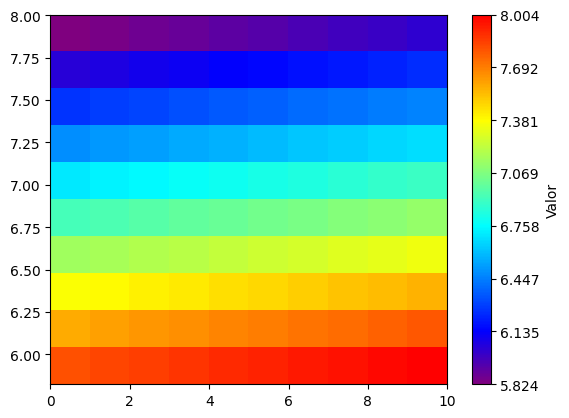

In [ ]:

import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Definir los colores en el orden de la escala de un heatmap típico
colores_heatmap = [(0.5, 0.0, 0.5),     # Violeta
                   (0.0, 0.0, 1.0),     # Azul
                   (0.0, 0.5, 1.0),     # Azul claro
                   (0.0, 1.0, 1.0),     # Cian
                   (0.5, 1.0, 0.5),     # Verde claro
                   (1.0, 1.0, 0.0),     # Amarillo
                   (1.0, 0.5, 0.0),     # Naranja
                   (1.0, 0.0, 0.0)]     # Rojo

# Crear la paleta de colores personalizada
paleta_personalizada = LinearSegmentedColormap.from_list('mi_paleta_heatmap', colores_heatmap)

# Crear un array de datos con valores de 0 a 1
#datos = np.linspace(0, 3, 100).reshape(10, 10)
datos = np.linspace(np.min(cen1['z']), np.max(cen1['z']), 100).reshape(10, 10)

# Mostrar el rectángulo de colores
imagen = plt.imshow(datos, cmap=paleta_personalizada, aspect='auto', extent=[0, 10, np.min(cen1['z']), np.max(cen1['z'])])

# Añadir una barra de color con valores correspondientes
valores = np.linspace(np.min(cen1['z']), np.max(cen1['z']), num=len(colores_heatmap))
display(np.max(cen1['z']))
display(np.min(cen1['z']))
barra_de_color = plt.colorbar(imagen, ticks=valores)
barra_de_color.set_label('Valor')

plt.show()

In [ ]:
from shapely.geometry import Polygon, Point

# Supongamos que tienes las coordenadas de los vértices del polígono que delimita el área de zoom
# en forma de una lista de puntos [(lat1, lon1), (lat2, lon2), ..., (latn, lonn)]

# Define una lista de coordenadas de los vértices del polígono
#vertices = [(lat1, lon1), (lat2, lon2), ..., (latn, lonn)]
vertices =[(9.990491,-73.970947),(10.087854,-73.745728),(10.268979,-73.55072),(10.439196,-73.270569),(10.498614,-73.157959),(10.417586,-73.092041),(10.128413,-73.193665),(9.876864,-73.232117),(9.606166,-73.273315),(9.421968,-73.427124),(9.327121,-73.611145),(9.346092,-73.704529),(9.51137,-73.748474),(9.7253,-73.839111),(9.914744,-73.968201),(9.990491,-73.970947)]

# Crea un objeto poligonal a partir de los vértices del polígono
poligono = Polygon(vertices)

# Ahora supongamos que tienes los datos interpolados en forma de un DataFrame llamado 'datos_interpolados'
print(len(model))
# Itera sobre los puntos de datos interpolados y verifica si están dentro del polígono
datos_en_area_de_ph = []
for indice, fila in model.iterrows():
    punto = Point(fila[model.columns[0]], fila[model.columns[1]])
    if punto.within(poligono):
        datos_en_area_de_ph.append(fila)
print(len(datos_en_area_de_ph))
# Ahora 'datos_en_area_de_zoom' contiene solo los datos interpolados que se encuentran dentro del área de zoom
datos_en_area_de_ph=pd.DataFrame(datos_en_area_de_ph)


40000
19315


In [ ]:
# Crear un mapa de Folium centrado en una ubicación inicial
mapa = folium.Map(location=[10.3889, -73.2419], zoom_start=9)  # Ejemplo de centro en Valledupar, Colombia

# Convertir los datos en una lista de listas
datos_calor = [[fila[datos_en_area_de_ph.columns[0]], fila[datos_en_area_de_ph.columns[1]], fila[datos_en_area_de_ph.columns[2]]] for indice, fila in datos_en_area_de_ph.iterrows()]

# Agregar el mapa de calor al mapa de Folium
HeatMap(datos_calor).add_to(mapa)


# Mostrar el mapa
mapa

In [ ]:
datos_en_area_de_ph


,x,y,z
1109,9.961079,-73.969854,5.270473
1110,9.967435,-73.969719,5.305375
1111,9.973792,-73.969584,5.339992
1112,9.980148,-73.969449,5.374219
1113,9.986505,-73.969313,5.407941
...,...,...,...
39981,10.399192,-73.098750,7.127689
39982,10.405539,-73.098585,7.088667
39983,10.411887,-73.098421,7.045284
39984,10.418234,-73.098256,6.997536


In [ ]:
cen2,model=modelo(1)
cen2.columns=['x','y','z']
model.columns=['x','y','z']
for i in range(len(cen2[cen2.columns[0]])):
  cen2[cen2.columns[0]][i],cen2[cen2.columns[1]][i]=utm_a_latlon(cen2[cen2.columns[0]][i], cen2[cen2.columns[1]][i], 18, False)
cen2[cen2.columns[0]]-=4.406748803477798
cen2[cen2.columns[1]]-=3.742387573777208

for i in range(len(model[model.columns[0]])):
  model[model.columns[0]][i],model[model.columns[1]][i]=utm_a_latlon(model[model.columns[0]][i], model[model.columns[1]][i], 18, False)
model[model.columns[0]]-=4.406748803477798
model[model.columns[1]]-=3.742387573777208

In [ ]:
# Crear un mapa de Folium centrado en una ubicación inicial
mapa = folium.Map(location=[10.3889, -73.2419], zoom_start=9)  # Ejemplo de centro en Valledupar, Colombia

# Convertir los datos en una lista de listas
datos_calor = [[fila[cen2.columns[0]], fila[cen2.columns[1]], fila[cen2.columns[2]]] for indice, fila in cen2.iterrows()]

# Agregar el mapa de calor al mapa de Folium
HeatMap(datos_calor).add_to(mapa)

# Mostrar el mapa
mapa

1065.1087499999999

6.568571428571429

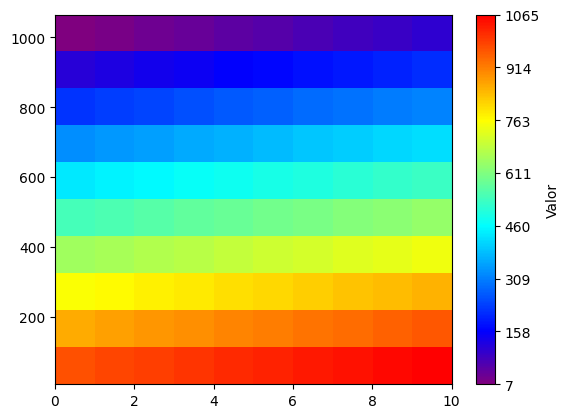

In [ ]:
# Definir los colores en el orden de la escala de un heatmap típico
colores_heatmap = [(0.5, 0.0, 0.5),     # Violeta
                   (0.0, 0.0, 1.0),     # Azul
                   (0.0, 0.5, 1.0),     # Azul claro
                   (0.0, 1.0, 1.0),     # Cian
                   (0.5, 1.0, 0.5),     # Verde claro
                   (1.0, 1.0, 0.0),     # Amarillo
                   (1.0, 0.5, 0.0),     # Naranja
                   (1.0, 0.0, 0.0)]     # Rojo

# Crear la paleta de colores personalizada
paleta_personalizada = LinearSegmentedColormap.from_list('mi_paleta_heatmap', colores_heatmap)

# Crear un array de datos con valores de 0 a 1
#datos = np.linspace(0, 3, 100).reshape(10, 10)
datos = np.linspace(np.min(cen2['z']), np.max(cen2['z']), 100).reshape(10, 10)

# Mostrar el rectángulo de colores
imagen = plt.imshow(datos, cmap=paleta_personalizada, aspect='auto', extent=[0, 10, np.min(cen2['z']), np.max(cen2['z'])])

# Añadir una barra de color con valores correspondientes
valores = np.linspace(np.min(cen2['z']), np.max(cen2['z']), num=len(colores_heatmap))
display(np.max(cen2['z']))
display(np.min(cen2['z']))
barra_de_color = plt.colorbar(imagen, ticks=valores)
barra_de_color.set_label('Valor')

plt.show()

In [ ]:
from shapely.geometry import Polygon, Point

# Supongamos que tienes las coordenadas de los vértices del polígono que delimita el área de zoom
# en forma de una lista de puntos [(lat1, lon1), (lat2, lon2), ..., (latn, lonn)]

# Define una lista de coordenadas de los vértices del polígono
#vertices = [(lat1, lon1), (lat2, lon2), ..., (latn, lonn)]
vertices =[(9.990491,-73.970947),(10.087854,-73.745728),(10.268979,-73.55072),(10.439196,-73.270569),(10.498614,-73.157959),(10.417586,-73.092041),(10.128413,-73.193665),(9.876864,-73.232117),(9.606166,-73.273315),(9.421968,-73.427124),(9.327121,-73.611145),(9.346092,-73.704529),(9.51137,-73.748474),(9.7253,-73.839111),(9.914744,-73.968201),(9.990491,-73.970947)]

# Crea un objeto poligonal a partir de los vértices del polígono
poligono = Polygon(vertices)

# Ahora supongamos que tienes los datos interpolados en forma de un DataFrame llamado 'datos_interpolados'
print(len(model))
# Itera sobre los puntos de datos interpolados y verifica si están dentro del polígono
datos_en_area_de_condelectrica = []
for indice, fila in model.iterrows():
    punto = Point(fila[model.columns[0]], fila[model.columns[1]])
    if punto.within(poligono):
        datos_en_area_de_condelectrica.append(fila)
print(len(datos_en_area_de_condelectrica))
# Ahora 'datos_en_area_de_zoom' contiene solo los datos interpolados que se encuentran dentro del área de zoom
datos_en_area_de_condelectrica=pd.DataFrame(datos_en_area_de_condelectrica)

40000
19315


In [ ]:
# Crear un mapa de Folium centrado en una ubicación inicial
mapa = folium.Map(location=[10.3889, -73.2419], zoom_start=9)  # Ejemplo de centro en Valledupar, Colombia

# Convertir los datos en una lista de listas
datos_calor = [[fila[datos_en_area_de_condelectrica.columns[0]], fila[datos_en_area_de_condelectrica.columns[1]], fila[datos_en_area_de_condelectrica.columns[2]]] for indice, fila in datos_en_area_de_condelectrica.iterrows()]

# Agregar el mapa de calor al mapa de Folium
HeatMap(datos_calor).add_to(mapa)


# Mostrar el mapa
mapa

In [ ]:
datos_en_area_de_condelectrica

,x,y,z
1109,9.961079,-73.969854,23.445145
1110,9.967435,-73.969719,23.076825
1111,9.973792,-73.969584,22.592801
1112,9.980148,-73.969449,22.002096
1113,9.986505,-73.969313,21.314453
...,...,...,...
39981,10.399192,-73.098750,323.444213
39982,10.405539,-73.098585,316.196772
39983,10.411887,-73.098421,308.041917
39984,10.418234,-73.098256,299.058565


In [ ]:
cen3,model=modelo(2)
cen3.columns=['x','y','z']
model.columns=['x','y','z']
for i in range(len(cen3[cen3.columns[0]])):
  cen3[cen3.columns[0]][i],cen3[cen3.columns[1]][i]=utm_a_latlon(cen3[cen3.columns[0]][i], cen3[cen3.columns[1]][i], 18, False)
cen3[cen3.columns[0]]-=4.406748803477798
cen3[cen3.columns[1]]-=3.742387573777208

for i in range(len(model[model.columns[0]])):
  model[model.columns[0]][i],model[model.columns[1]][i]=utm_a_latlon(model[model.columns[0]][i], model[model.columns[1]][i], 18, False)
model[model.columns[0]]-=4.406748803477798
model[model.columns[1]]-=3.742387573777208

In [ ]:
# Crear un mapa de Folium centrado en una ubicación inicial
mapa = folium.Map(location=[10.3889, -73.2419], zoom_start=9)  # Ejemplo de centro en Valledupar, Colombia

# Convertir los datos en una lista de listas
datos_calor = [[fila[cen3.columns[0]], fila[cen3.columns[1]], fila[cen3.columns[2]]] for indice, fila in cen3.iterrows()]

# Agregar el mapa de calor al mapa de Folium
HeatMap(datos_calor).add_to(mapa)

# Mostrar el mapa
mapa

31.942857142857143

29.792307692307688

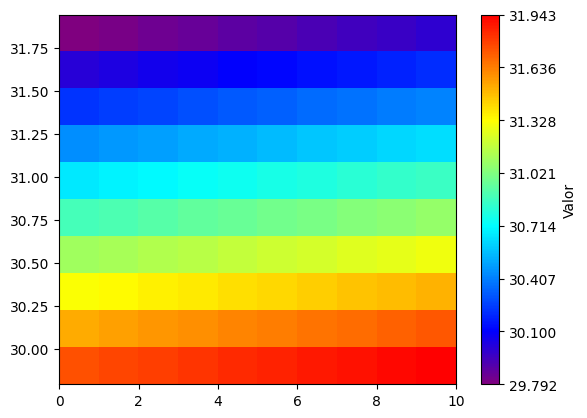

In [ ]:
# Definir los colores en el orden de la escala de un heatmap típico
colores_heatmap = [(0.5, 0.0, 0.5),     # Violeta
                   (0.0, 0.0, 1.0),     # Azul
                   (0.0, 0.5, 1.0),     # Azul claro
                   (0.0, 1.0, 1.0),     # Cian
                   (0.5, 1.0, 0.5),     # Verde claro
                   (1.0, 1.0, 0.0),     # Amarillo
                   (1.0, 0.5, 0.0),     # Naranja
                   (1.0, 0.0, 0.0)]     # Rojo

# Crear la paleta de colores personalizada
paleta_personalizada = LinearSegmentedColormap.from_list('mi_paleta_heatmap', colores_heatmap)

# Crear un array de datos con valores de 0 a 1
#datos = np.linspace(0, 3, 100).reshape(10, 10)
datos = np.linspace(np.min(cen3['z']), np.max(cen3['z']), 100).reshape(10, 10)

# Mostrar el rectángulo de colores
imagen = plt.imshow(datos, cmap=paleta_personalizada, aspect='auto', extent=[0, 10, np.min(cen3['z']), np.max(cen3['z'])])

# Añadir una barra de color con valores correspondientes
valores = np.linspace(np.min(cen3['z']), np.max(cen3['z']), num=len(colores_heatmap))
display(np.max(cen3['z']))
display(np.min(cen3['z']))
barra_de_color = plt.colorbar(imagen, ticks=valores)
barra_de_color.set_label('Valor')

plt.show()

In [ ]:
from shapely.geometry import Polygon, Point

# Supongamos que tienes las coordenadas de los vértices del polígono que delimita el área de zoom
# en forma de una lista de puntos [(lat1, lon1), (lat2, lon2), ..., (latn, lonn)]

# Define una lista de coordenadas de los vértices del polígono
#vertices = [(lat1, lon1), (lat2, lon2), ..., (latn, lonn)]
vertices =[(9.990491,-73.970947),(10.087854,-73.745728),(10.268979,-73.55072),(10.439196,-73.270569),(10.498614,-73.157959),(10.417586,-73.092041),(10.128413,-73.193665),(9.876864,-73.232117),(9.606166,-73.273315),(9.421968,-73.427124),(9.327121,-73.611145),(9.346092,-73.704529),(9.51137,-73.748474),(9.7253,-73.839111),(9.914744,-73.968201),(9.990491,-73.970947)]

# Crea un objeto poligonal a partir de los vértices del polígono
poligono = Polygon(vertices)

# Ahora supongamos que tienes los datos interpolados en forma de un DataFrame llamado 'datos_interpolados'
print(len(model))
# Itera sobre los puntos de datos interpolados y verifica si están dentro del polígono
datos_en_area_de_temp = []
for indice, fila in model.iterrows():
    punto = Point(fila[model.columns[0]], fila[model.columns[1]])
    if punto.within(poligono):
        datos_en_area_de_temp.append(fila)
print(len(datos_en_area_de_temp))
# Ahora 'datos_en_area_de_zoom' contiene solo los datos interpolados que se encuentran dentro del área de zoom
datos_en_area_de_temp=pd.DataFrame(datos_en_area_de_temp)

40000
19315


In [ ]:
# Crear un mapa de Folium centrado en una ubicación inicial
mapa = folium.Map(location=[10.3889, -73.2419], zoom_start=9)  # Ejemplo de centro en Valledupar, Colombia

# Convertir los datos en una lista de listas
datos_calor = [[fila[datos_en_area_de_temp.columns[0]], fila[datos_en_area_de_temp.columns[1]], fila[datos_en_area_de_temp.columns[2]]] for indice, fila in datos_en_area_de_temp.iterrows()]

# Agregar el mapa de calor al mapa de Folium
HeatMap(datos_calor).add_to(mapa)


# Mostrar el mapa
mapa

In [ ]:
datos_en_area_de_temp

,x,y,z
1109,9.961079,-73.969854,28.920181
1110,9.967435,-73.969719,28.746340
1111,9.973792,-73.969584,28.575943
1112,9.980148,-73.969449,28.409455
1113,9.986505,-73.969313,28.247313
...,...,...,...
39981,10.399192,-73.098750,31.565896
39982,10.405539,-73.098585,31.512507
39983,10.411887,-73.098421,31.447626
39984,10.418234,-73.098256,31.371199


In [ ]:
cen4,model=modelo(3)
cen4.columns=['x','y','z']
model.columns=['x','y','z']
for i in range(len(cen4[cen4.columns[0]])):
  cen4[cen4.columns[0]][i],cen4[cen4.columns[1]][i]=utm_a_latlon(cen4[cen4.columns[0]][i], cen4[cen4.columns[1]][i], 18, False)
cen4[cen4.columns[0]]-=4.406748803477798
cen4[cen4.columns[1]]-=3.742387573777208

for i in range(len(model[model.columns[0]])):
  model[model.columns[0]][i],model[model.columns[1]][i]=utm_a_latlon(model[model.columns[0]][i], model[model.columns[1]][i], 18, False)
model[model.columns[0]]-=4.406748803477798
model[model.columns[1]]-=3.742387573777208

In [ ]:
# Crear un mapa de Folium centrado en una ubicación inicial
mapa = folium.Map(location=[10.3889, -73.2419], zoom_start=9)  # Ejemplo de centro en Valledupar, Colombia

# Convertir los datos en una lista de listas
datos_calor = [[fila[cen4.columns[0]], fila[cen4.columns[1]], fila[cen4.columns[2]]] for indice, fila in cen4.iterrows()]

# Agregar el mapa de calor al mapa de Folium
HeatMap(datos_calor).add_to(mapa)

# Mostrar el mapa
mapa

362.0023157894737

3.5298571428571432

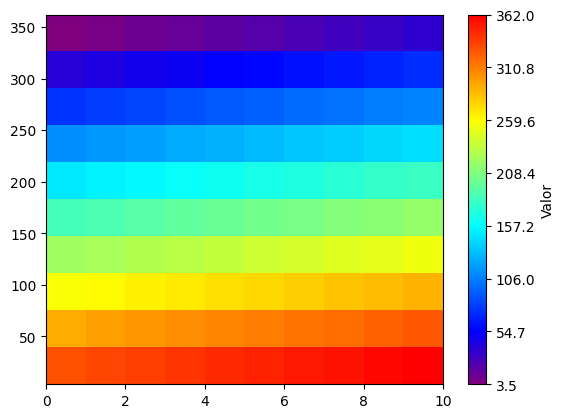

In [ ]:
# Definir los colores en el orden de la escala de un heatmap típico
colores_heatmap = [(0.5, 0.0, 0.5),     # Violeta
                   (0.0, 0.0, 1.0),     # Azul
                   (0.0, 0.5, 1.0),     # Azul claro
                   (0.0, 1.0, 1.0),     # Cian
                   (0.5, 1.0, 0.5),     # Verde claro
                   (1.0, 1.0, 0.0),     # Amarillo
                   (1.0, 0.5, 0.0),     # Naranja
                   (1.0, 0.0, 0.0)]     # Rojo

# Crear la paleta de colores personalizada
paleta_personalizada = LinearSegmentedColormap.from_list('mi_paleta_heatmap', colores_heatmap)

# Crear un array de datos con valores de 0 a 1
#datos = np.linspace(0, 3, 100).reshape(10, 10)
datos = np.linspace(np.min(cen4['z']), np.max(cen4['z']), 100).reshape(10, 10)

# Mostrar el rectángulo de colores
imagen = plt.imshow(datos, cmap=paleta_personalizada, aspect='auto', extent=[0, 10, np.min(cen4['z']), np.max(cen4['z'])])

# Añadir una barra de color con valores correspondientes
valores = np.linspace(np.min(cen4['z']), np.max(cen4['z']), num=len(colores_heatmap))
display(np.max(cen4['z']))
display(np.min(cen4['z']))
barra_de_color = plt.colorbar(imagen, ticks=valores)
barra_de_color.set_label('Valor')

plt.show()

In [ ]:
from shapely.geometry import Polygon, Point

# Supongamos que tienes las coordenadas de los vértices del polígono que delimita el área de zoom
# en forma de una lista de puntos [(lat1, lon1), (lat2, lon2), ..., (latn, lonn)]

# Define una lista de coordenadas de los vértices del polígono
#vertices = [(lat1, lon1), (lat2, lon2), ..., (latn, lonn)]
vertices =[(9.990491,-73.970947),(10.087854,-73.745728),(10.268979,-73.55072),(10.439196,-73.270569),(10.498614,-73.157959),(10.417586,-73.092041),(10.128413,-73.193665),(9.876864,-73.232117),(9.606166,-73.273315),(9.421968,-73.427124),(9.327121,-73.611145),(9.346092,-73.704529),(9.51137,-73.748474),(9.7253,-73.839111),(9.914744,-73.968201),(9.990491,-73.970947)]

# Crea un objeto poligonal a partir de los vértices del polígono
poligono = Polygon(vertices)

# Ahora supongamos que tienes los datos interpolados en forma de un DataFrame llamado 'datos_interpolados'
print(len(model))
# Itera sobre los puntos de datos interpolados y verifica si están dentro del polígono
datos_en_area_de_sdt = []
for indice, fila in model.iterrows():
    punto = Point(fila[model.columns[0]], fila[model.columns[1]])
    if punto.within(poligono):
        datos_en_area_de_sdt.append(fila)
print(len(datos_en_area_de_sdt))
# Ahora 'datos_en_area_de_zoom' contiene solo los datos interpolados que se encuentran dentro del área de zoom
datos_en_area_de_sdt=pd.DataFrame(datos_en_area_de_sdt)

40000
19315


In [ ]:
# Crear un mapa de Folium centrado en una ubicación inicial
mapa = folium.Map(location=[10.3889, -73.2419], zoom_start=9)  # Ejemplo de centro en Valledupar, Colombia

# Convertir los datos en una lista de listas
datos_calor = [[fila[datos_en_area_de_sdt.columns[0]], fila[datos_en_area_de_sdt.columns[1]], fila[datos_en_area_de_sdt.columns[2]]] for indice, fila in datos_en_area_de_sdt.iterrows()]

# Agregar el mapa de calor al mapa de Folium
HeatMap(datos_calor).add_to(mapa)


# Mostrar el mapa
mapa

In [ ]:
datos_en_area_de_sdt

,x,y,z
1109,9.961079,-73.969854,22.848902
1110,9.967435,-73.969719,23.115008
1111,9.973792,-73.969584,23.215450
1112,9.980148,-73.969449,23.158317
1113,9.986505,-73.969313,22.952572
...,...,...,...
39981,10.399192,-73.098750,408.930066
39982,10.405539,-73.098585,414.971405
39983,10.411887,-73.098421,419.953390
39984,10.418234,-73.098256,423.839678


In [ ]:
cen5,model=modelo(4)
cen5.columns=['x','y','z']
model.columns=['x','y','z']
for i in range(len(cen5[cen5.columns[0]])):
  cen5[cen5.columns[0]][i],cen5[cen5.columns[1]][i]=utm_a_latlon(cen5[cen5.columns[0]][i], cen5[cen5.columns[1]][i], 18, False)
cen5[cen5.columns[0]]-=4.406748803477798
cen5[cen5.columns[1]]-=3.742387573777208

for i in range(len(model[model.columns[0]])):
  model[model.columns[0]][i],model[model.columns[1]][i]=utm_a_latlon(model[model.columns[0]][i], model[model.columns[1]][i], 18, False)
model[model.columns[0]]-=4.406748803477798
model[model.columns[1]]-=3.742387573777208

In [ ]:
# Crear un mapa de Folium centrado en una ubicación inicial
mapa = folium.Map(location=[10.3889, -73.2419], zoom_start=9)  # Ejemplo de centro en Valledupar, Colombia

# Convertir los datos en una lista de listas
datos_calor = [[fila[cen5.columns[0]], fila[cen5.columns[1]], fila[cen5.columns[2]]] for indice, fila in cen5.iterrows()]

# Agregar el mapa de calor al mapa de Folium
HeatMap(datos_calor).add_to(mapa)

# Mostrar el mapa
mapa

5.682857142857144

1.3353333333333335

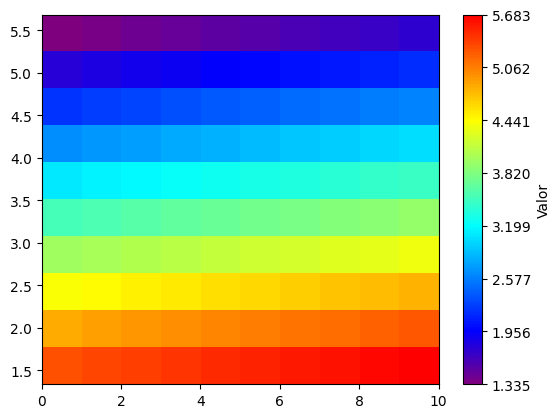

In [ ]:
# Definir los colores en el orden de la escala de un heatmap típico
colores_heatmap = [(0.5, 0.0, 0.5),     # Violeta
                   (0.0, 0.0, 1.0),     # Azul
                   (0.0, 0.5, 1.0),     # Azul claro
                   (0.0, 1.0, 1.0),     # Cian
                   (0.5, 1.0, 0.5),     # Verde claro
                   (1.0, 1.0, 0.0),     # Amarillo
                   (1.0, 0.5, 0.0),     # Naranja
                   (1.0, 0.0, 0.0)]     # Rojo

# Crear la paleta de colores personalizada
paleta_personalizada = LinearSegmentedColormap.from_list('mi_paleta_heatmap', colores_heatmap)

# Crear un array de datos con valores de 0 a 1
#datos = np.linspace(0, 3, 100).reshape(10, 10)
datos = np.linspace(np.min(cen5['z']), np.max(cen5['z']), 100).reshape(10, 10)

# Mostrar el rectángulo de colores
imagen = plt.imshow(datos, cmap=paleta_personalizada, aspect='auto', extent=[0, 10, np.min(cen5['z']), np.max(cen5['z'])])

# Añadir una barra de color con valores correspondientes
valores = np.linspace(np.min(cen5['z']), np.max(cen5['z']), num=len(colores_heatmap))
display(np.max(cen5['z']))
display(np.min(cen5['z']))
barra_de_color = plt.colorbar(imagen, ticks=valores)
barra_de_color.set_label('Valor')

plt.show()

In [ ]:
# Supongamos que tienes las coordenadas de los vértices del polígono que delimita el área de zoom
# en forma de una lista de puntos [(lat1, lon1), (lat2, lon2), ..., (latn, lonn)]

# Define una lista de coordenadas de los vértices del polígono
#vertices = [(lat1, lon1), (lat2, lon2), ..., (latn, lonn)]
vertices =[(9.990491,-73.970947),(10.087854,-73.745728),(10.268979,-73.55072),(10.439196,-73.270569),(10.498614,-73.157959),(10.417586,-73.092041),(10.128413,-73.193665),(9.876864,-73.232117),(9.606166,-73.273315),(9.421968,-73.427124),(9.327121,-73.611145),(9.346092,-73.704529),(9.51137,-73.748474),(9.7253,-73.839111),(9.914744,-73.968201),(9.990491,-73.970947)]

# Crea un objeto poligonal a partir de los vértices del polígono
poligono = Polygon(vertices)

# Ahora supongamos que tienes los datos interpolados en forma de un DataFrame llamado 'datos_interpolados'
print(len(model))
# Itera sobre los puntos de datos interpolados y verifica si están dentro del polígono
datos_en_area_de_odisuelto = []
for indice, fila in model.iterrows():
    punto = Point(fila[model.columns[0]], fila[model.columns[1]])
    if punto.within(poligono):
        datos_en_area_de_odisuelto.append(fila)
print(len(datos_en_area_de_odisuelto))
# Ahora 'datos_en_area_de_zoom' contiene solo los datos interpolados que se encuentran dentro del área de zoom
datos_en_area_de_odisuelto=pd.DataFrame(datos_en_area_de_odisuelto)

40000
19315


In [ ]:
# Crear un mapa de Folium centrado en una ubicación inicial
mapa = folium.Map(location=[10.3889, -73.2419], zoom_start=9)  # Ejemplo de centro en Valledupar, Colombia

# Convertir los datos en una lista de listas
datos_calor = [[fila[datos_en_area_de_odisuelto.columns[0]], fila[datos_en_area_de_odisuelto.columns[1]], fila[datos_en_area_de_odisuelto.columns[2]]] for indice, fila in datos_en_area_de_odisuelto.iterrows()]

# Agregar el mapa de calor al mapa de Folium
HeatMap(datos_calor).add_to(mapa)


# Mostrar el mapa
mapa

In [ ]:
datos_en_area_de_odisuelto

,x,y,z
1109,9.961079,-73.969854,1.940605
1110,9.967435,-73.969719,1.924026
1111,9.973792,-73.969584,1.905624
1112,9.980148,-73.969449,1.885432
1113,9.986505,-73.969313,1.863488
...,...,...,...
39981,10.399192,-73.098750,3.739945
39982,10.405539,-73.098585,3.711252
39983,10.411887,-73.098421,3.676911
39984,10.418234,-73.098256,3.637021


In [ ]:
cen6,model=modelo(5)
cen6.columns=['x','y','z']
model.columns=['x','y','z']
for i in range(len(cen6[cen6.columns[0]])):
  cen6[cen6.columns[0]][i],cen6[cen6.columns[1]][i]=utm_a_latlon(cen6[cen6.columns[0]][i], cen6[cen6.columns[1]][i], 18, False)
cen6[cen6.columns[0]]-=4.406748803477798
cen6[cen6.columns[1]]-=3.742387573777208

for i in range(len(model[model.columns[0]])):
  model[model.columns[0]][i],model[model.columns[1]][i]=utm_a_latlon(model[model.columns[0]][i], model[model.columns[1]][i], 18, False)
model[model.columns[0]]-=4.406748803477798
model[model.columns[1]]-=3.742387573777208

In [ ]:
# Crear un mapa de Folium centrado en una ubicación inicial
mapa = folium.Map(location=[10.3889, -73.2419], zoom_start=9)  # Ejemplo de centro en Valledupar, Colombia

# Convertir los datos en una lista de listas
datos_calor = [[fila[cen6.columns[0]], fila[cen6.columns[1]], fila[cen6.columns[2]]] for indice, fila in cen6.iterrows()]

# Agregar el mapa de calor al mapa de Folium
HeatMap(datos_calor, opacity=0.1).add_to(mapa)

# Mostrar el mapa
mapa

6.628333333333333

0.24769230769230768

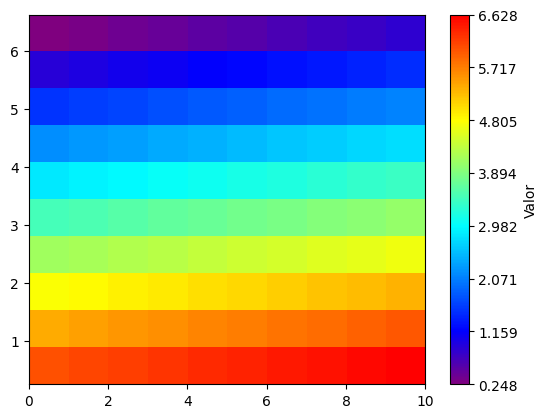

In [ ]:
# Definir los colores en el orden de la escala de un heatmap típico
colores_heatmap = [(0.5, 0.0, 0.5),     # Violeta
                   (0.0, 0.0, 1.0),     # Azul
                   (0.0, 0.5, 1.0),     # Azul claro
                   (0.0, 1.0, 1.0),     # Cian
                   (0.5, 1.0, 0.5),     # Verde claro
                   (1.0, 1.0, 0.0),     # Amarillo
                   (1.0, 0.5, 0.0),     # Naranja
                   (1.0, 0.0, 0.0)]     # Rojo

# Crear la paleta de colores personalizada
paleta_personalizada = LinearSegmentedColormap.from_list('mi_paleta_heatmap', colores_heatmap)

# Crear un array de datos con valores de 0 a 1
#datos = np.linspace(0, 3, 100).reshape(10, 10)
datos = np.linspace(np.min(cen6['z']), np.max(cen6['z']), 100).reshape(10, 10)

# Mostrar el rectángulo de colores
imagen = plt.imshow(datos, cmap=paleta_personalizada, aspect='auto', extent=[0, 10, np.min(cen6['z']), np.max(cen6['z'])])

# Añadir una barra de color con valores correspondientes
valores = np.linspace(np.min(cen6['z']), np.max(cen6['z']), num=len(colores_heatmap))
display(np.max(cen6['z']))
display(np.min(cen6['z']))
barra_de_color = plt.colorbar(imagen, ticks=valores)
barra_de_color.set_label('Valor')

plt.show()

In [ ]:
# Supongamos que tienes las coordenadas de los vértices del polígono que delimita el área de zoom
# en forma de una lista de puntos [(lat1, lon1), (lat2, lon2), ..., (latn, lonn)]

# Define una lista de coordenadas de los vértices del polígono
#vertices = [(lat1, lon1), (lat2, lon2), ..., (latn, lonn)]
vertices =[(9.990491,-73.970947),(10.087854,-73.745728),(10.268979,-73.55072),(10.439196,-73.270569),(10.498614,-73.157959),(10.417586,-73.092041),(10.128413,-73.193665),(9.876864,-73.232117),(9.606166,-73.273315),(9.421968,-73.427124),(9.327121,-73.611145),(9.346092,-73.704529),(9.51137,-73.748474),(9.7253,-73.839111),(9.914744,-73.968201),(9.990491,-73.970947)]

# Crea un objeto poligonal a partir de los vértices del polígono
poligono = Polygon(vertices)

# Ahora supongamos que tienes los datos interpolados en forma de un DataFrame llamado 'datos_interpolados'
print(len(model))
# Itera sobre los puntos de datos interpolados y verifica si están dentro del polígono
datos_en_area_de_salinidad = []
for indice, fila in model.iterrows():
    punto = Point(fila[model.columns[0]], fila[model.columns[1]])
    if punto.within(poligono):
        datos_en_area_de_salinidad.append(fila)
print(len(datos_en_area_de_salinidad))
# Ahora 'datos_en_area_de_zoom' contiene solo los datos interpolados que se encuentran dentro del área de zoom
datos_en_area_de_salinidad=pd.DataFrame(datos_en_area_de_salinidad)

40000
19315


In [ ]:
# Crear un mapa de Folium centrado en una ubicación inicial
mapa = folium.Map(location=[10.3889, -73.2419], zoom_start=9)  # Ejemplo de centro en Valledupar, Colombia

# Convertir los datos en una lista de listas
datos_calor = [[fila[datos_en_area_de_salinidad.columns[0]], fila[datos_en_area_de_salinidad.columns[1]], fila[datos_en_area_de_salinidad.columns[2]]] for indice, fila in datos_en_area_de_salinidad.iterrows()]

# Agregar el mapa de calor al mapa de Folium
HeatMap(datos_calor).add_to(mapa)


# Mostrar el mapa
mapa

In [ ]:
datos_en_area_de_salinidad

,x,y,z
1109,9.961079,-73.969854,6.490833
1110,9.967435,-73.969719,6.479121
1111,9.973792,-73.969584,6.459724
1112,9.980148,-73.969449,6.432720
1113,9.986505,-73.969313,6.398211
...,...,...,...
39981,10.399192,-73.098750,1.542707
39982,10.405539,-73.098585,1.532719
39983,10.411887,-73.098421,1.520132
39984,10.418234,-73.098256,1.505042


In [ ]:
cen7,model=modelo(6)
cen7.columns=['x','y','z']
model.columns=['x','y','z']
for i in range(len(cen[cen7.columns[0]])):
  cen7[cen7.columns[0]][i],cen7[cen7.columns[1]][i]=utm_a_latlon(cen7[cen7.columns[0]][i], cen7[cen7.columns[1]][i], 18, False)
cen7[cen7.columns[0]]-=4.406748803477798
cen7[cen7.columns[1]]-=3.742387573777208

for i in range(len(model[model.columns[0]])):
  model[model.columns[0]][i],model[model.columns[1]][i]=utm_a_latlon(model[model.columns[0]][i], model[model.columns[1]][i], 18, False)
model[model.columns[0]]-=4.406748803477798
model[model.columns[1]]-=3.742387573777208

In [ ]:
# Función para agregar la leyenda personalizada al mapa
def agregar_leyenda(mapa):
    leyenda_html = """
    <div style="
        position: fixed;
        bottom: 50px;
        left: 50px;
        z-index:9999;
        padding: 6px 8px;
        border: 1px solid #ccc;
        background: white;
        ">
        <p><strong>Leyenda</strong></p>
        <p><span style="background-color:#FF0000; width:20px; height:20px; display:inline-block;"></span> Baja</p>
        <p><span style="background-color:#FFFF00; width:20px; height:20px; display:inline-block;"></span> Media</p>
        <p><span style="background-color:#00FF00; width:20px; height:20px; display:inline-block;"></span> Alta</p>
    </div>
    """
    mapa.get_root().html.add_child(folium.Element(leyenda_html))
# Crear un mapa de Folium centrado en una ubicación inicial
mapa = folium.Map(location=[10.3889, -73.2419], zoom_start=9)  # Ejemplo de centro en Valledupar, Colombia

# Convertir los datos en una lista de listas
datos_calor = [[fila[cen7.columns[0]], fila[cen7.columns[1]], fila[cen7.columns[2]]] for indice, fila in cen7.iterrows()]

# Agregar el mapa de calor al mapa de Folium
HeatMap(datos_calor).add_to(mapa)

# Agregar la leyenda personalizada al mapa
agregar_leyenda(mapa)

# Agregar la funcionalidad de dibujar cuadrículas
draw = Draw(export=True)
draw.add_to(mapa)
# Mostrar el mapa
mapa



402.74685

1.9903333333333337

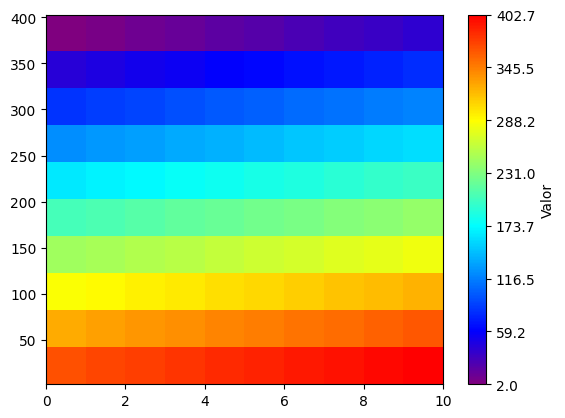

In [ ]:
# Definir los colores en el orden de la escala de un heatmap típico
colores_heatmap = [(0.5, 0.0, 0.5),     # Violeta
                   (0.0, 0.0, 1.0),     # Azul
                   (0.0, 0.5, 1.0),     # Azul claro
                   (0.0, 1.0, 1.0),     # Cian
                   (0.5, 1.0, 0.5),     # Verde claro
                   (1.0, 1.0, 0.0),     # Amarillo
                   (1.0, 0.5, 0.0),     # Naranja
                   (1.0, 0.0, 0.0)]     # Rojo

# Crear la paleta de colores personalizada
paleta_personalizada = LinearSegmentedColormap.from_list('mi_paleta_heatmap', colores_heatmap)

# Crear un array de datos con valores de 0 a 1
#datos = np.linspace(0, 3, 100).reshape(10, 10)
datos = np.linspace(np.min(cen7['z']), np.max(cen7['z']), 100).reshape(10, 10)

# Mostrar el rectángulo de colores
imagen = plt.imshow(datos, cmap=paleta_personalizada, aspect='auto', extent=[0, 10, np.min(cen7['z']), np.max(cen7['z'])])

# Añadir una barra de color con valores correspondientes
valores = np.linspace(np.min(cen7['z']), np.max(cen7['z']), num=len(colores_heatmap))
display(np.max(cen7['z']))
display(np.min(cen7['z']))
barra_de_color = plt.colorbar(imagen, ticks=valores)
barra_de_color.set_label('Valor')

plt.show()

In [ ]:
# Supongamos que tienes las coordenadas de los vértices del polígono que delimita el área de zoom
# en forma de una lista de puntos [(lat1, lon1), (lat2, lon2), ..., (latn, lonn)]

# Define una lista de coordenadas de los vértices del polígono
#vertices = [(lat1, lon1), (lat2, lon2), ..., (latn, lonn)]
vertices =[(9.990491,-73.970947),(10.087854,-73.745728),(10.268979,-73.55072),(10.439196,-73.270569),(10.498614,-73.157959),(10.417586,-73.092041),(10.128413,-73.193665),(9.876864,-73.232117),(9.606166,-73.273315),(9.421968,-73.427124),(9.327121,-73.611145),(9.346092,-73.704529),(9.51137,-73.748474),(9.7253,-73.839111),(9.914744,-73.968201),(9.990491,-73.970947)]

# Crea un objeto poligonal a partir de los vértices del polígono
poligono = Polygon(vertices)

# Ahora supongamos que tienes los datos interpolados en forma de un DataFrame llamado 'datos_interpolados'
print(len(model))
# Itera sobre los puntos de datos interpolados y verifica si están dentro del polígono
datos_en_area_de_resistividad = []
for indice, fila in model.iterrows():
    punto = Point(fila[model.columns[0]], fila[model.columns[1]])
    if punto.within(poligono):
        datos_en_area_de_resistividad.append(fila)
print(len(datos_en_area_de_resistividad))
# Ahora 'datos_en_area_de_zoom' contiene solo los datos interpolados que se encuentran dentro del área de zoom
datos_en_area_de_resistividad=pd.DataFrame(datos_en_area_de_resistividad)

40000
19315


In [ ]:
# Crear un mapa de Folium centrado en una ubicación inicial
mapa = folium.Map(location=[10.3889, -73.2419], zoom_start=9)  # Ejemplo de centro en Valledupar, Colombia

# Convertir los datos en una lista de listas
datos_calor = [[fila[datos_en_area_de_resistividad.columns[0]], fila[datos_en_area_de_resistividad.columns[1]], fila[datos_en_area_de_resistividad.columns[2]]] for indice, fila in datos_en_area_de_resistividad.iterrows()]

# Agregar el mapa de calor al mapa de Folium
HeatMap(datos_calor).add_to(mapa)


# Mostrar el mapa
mapa

In [ ]:
datos_en_area_de_resistividad

,x,y,z
1109,9.961079,-73.969854,92.113161
1110,9.967435,-73.969719,93.993070
1111,9.973792,-73.969584,95.811529
1112,9.980148,-73.969449,97.553888
1113,9.986505,-73.969313,99.205758
...,...,...,...
39981,10.399192,-73.098750,155.539969
39982,10.405539,-73.098585,155.950925
39983,10.411887,-73.098421,156.013641
39984,10.418234,-73.098256,155.728783


In [ ]:
datos_en_area_de_ph
datos_en_area_de_condelectrica
datos_en_area_de_temp
datos_en_area_de_sdt
datos_en_area_de_odisuelto
datos_en_area_de_salinidad
datos_en_area_de_resistividad

,x,y,z
1109,9.961079,-73.969854,92.113161
1110,9.967435,-73.969719,93.993070
1111,9.973792,-73.969584,95.811529
1112,9.980148,-73.969449,97.553888
1113,9.986505,-73.969313,99.205758
...,...,...,...
39981,10.399192,-73.098750,155.539969
39982,10.405539,-73.098585,155.950925
39983,10.411887,-73.098421,156.013641
39984,10.418234,-73.098256,155.728783


In [ ]:
import numpy as np
import plotly.graph_objects as go

# Supongamos que tienes tus datos en un array numpy
# Aquí hay un ejemplo de datos para tres variables x, y, z
data = np.array([
    cen1['z'],
    cen2['z'],
    cen3['z'],
    cen4['z'],
    cen5['z'],
    cen6['z'],
    cen7['z']
])

# Calcular la matriz de covarianza
cov_matrix = np.cov(data)

# Calcular la matriz de correlación (normalizar la covarianza)
correlation_matrix = np.corrcoef(data)

# Etiquetas para los ejes x e y
#nombres_variables = [flujoDeNormalidad.variables[0],flujoDeNormalidad.variables[1],flujoDeNormalidad.variables[2],flujoDeNormalidad.variables[3],flujoDeNormalidad.variables[4],flujoDeNormalidad.variables[5],flujoDeNormalidad.variables[6]]

nombres_variables=flujoDeNormalidad.variables
# Crear una figura de heatmap con Plotly
fig = go.Figure(data=go.Heatmap(z=correlation_matrix,
                                 x=nombres_variables,
                                 y=nombres_variables,
                                 colorscale='RdBu',
                                 zmin=-1,
                                 zmax=1,
                                 hovertemplate='Correlación: %{z:.2f}<extra></extra>'))

# Configurar el diseño del gráfico
fig.update_layout(
    title="Matriz de Correlación",
    xaxis_title="Variables",
    yaxis_title="Variables",
    width=800,
    height=800
)

# Mostrar el gráfico
fig.show()


In [ ]:
import numpy as np
import pandas as pd

# Supongamos que tienes tus datos en un array numpy
# Aquí hay un ejemplo de datos para tres variables x, y, z
data = np.array([
    cen1['z'],
    cen2['z'],
    cen3['z'],
    cen4['z'],
    cen5['z'],
    cen6['z'],
    cen7['z']
])

# Calcular la matriz de correlación (normalizar la covarianza)
correlation_matrix = np.corrcoef(data)

# Convertir la matriz de correlación en un DataFrame de pandas
df_correlation = pd.DataFrame(correlation_matrix)

# Mostrar el DataFrame
print("Matriz de Correlación:")
df_correlation.columns=flujoDeNormalidad.variables
df_correlation.index=flujoDeNormalidad.variables
df_correlation

Matriz de Correlación:


,pH,CON.ELECTRICA,TEMP,SDT,O.DISUELTO,SALINIDAD,RESISTIVIDAD
pH,1.000000,-0.075135,-0.308694,0.417712,-0.161088,-0.055236,0.141390
CON.ELECTRICA,-0.075135,1.000000,0.193556,-0.093601,0.108981,0.122757,0.097254
TEMP,-0.308694,0.193556,1.000000,-0.264710,0.168619,0.090227,0.155831
SDT,0.417712,-0.093601,-0.264710,1.000000,-0.097578,0.124445,0.068944
O.DISUELTO,-0.161088,0.108981,0.168619,-0.097578,1.000000,0.119837,-0.293321
SALINIDAD,-0.055236,0.122757,0.090227,0.124445,0.119837,1.000000,-0.200944
RESISTIVIDAD,0.141390,0.097254,0.155831,0.068944,-0.293321,-0.200944,1.000000
